In [6]:
print('Lead Scoring- Anurag Agarwal, Rithesh Parmeshwar & Lakhwinder Singh- DS 45')

Lead Scoring- Anurag Agarwal, Rithesh Parmeshwar & Lakhwinder Singh- DS 45


## Lead Scoring Case Study
X-Education is an education company sells online Education courses to professionals and marketing through online advertisements.  Company gets information through different channels and if candidates enquring with certain education level it calls lead. Typically lead conversion is 30% of certain education. Company identifying Hot Leads on certain criteria also. Lead conversion ratio is lesser than number of enrollment. comapny given Target to achieve 80% of total enrollment

#### Goals of the Case Study

- Build a logistic regression model to assign a lead score between 0 and 100 to each of the leads which can be used by the company to target potential leads. A higher score would mean that the lead is hot, i.e. is most likely to convert whereas a lower score would mean that the lead is cold and will mostly not get converted.
- There are some more problems presented by the company which your model should be able to adjust to if the company's requirement changes in the future so you will need to handle these as well.

#### Importing Libraries

In [7]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns


sns.set_style('whitegrid')

import sklearn

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression

from sklearn.feature_selection import RFE
from statsmodels.stats.outliers_influence import variance_inflation_factor
import statsmodels.api as sm
from sklearn import metrics
from sklearn.metrics import precision_score, recall_score
from sklearn.metrics import precision_recall_curve
from sklearn.metrics import confusion_matrix

#### Adjusting Output Views

In [8]:
# Adjusting Output Views

pd.set_option('display.max_rows', 500)
pd.set_option('display.max_columns', 500)
pd.set_option('display.width', 500)
pd.set_option('display.expand_frame_repr', False)

### Data Understanding

In [12]:
df = pd.read_csv("Leads.csv")

df.head(3)

,Prospect ID,Lead Number,Lead Origin,Lead Source,Do Not Email,Do Not Call,Converted,TotalVisits,Total Time Spent on Website,Page Views Per Visit,Last Activity,Country,Specialization,How did you hear about X Education,What is your current occupation,What matters most to you in choosing a course,Search,Magazine,Newspaper Article,X Education Forums,Newspaper,Digital Advertisement,Through Recommendations,Receive More Updates About Our Courses,Tags,Lead Quality,Update me on Supply Chain Content,Get updates on DM Content,Lead Profile,City,Asymmetrique Activity Index,Asymmetrique Profile Index,Asymmetrique Activity Score,Asymmetrique Profile Score,I agree to pay the amount through cheque,A free copy of Mastering The Interview,Last Notable Activity
0,7927b2df-8bba-4d29-b9a2-b6e0beafe620,660737,API,Olark Chat,No,No,0,0.0,0,0.0,Page Visited on Website,NaN,Select,Select,Unemployed,Better Career Prospects,No,No,No,No,No,No,No,No,Interested in other courses,Low in Relevance,No,No,Select,Select,02.Medium,02.Medium,15.0,15.0,No,No,Modified
1,2a272436-5132-4136-86fa-dcc88c88f482,660728,API,Organic Search,No,No,0,5.0,674,2.5,Email Opened,India,Select,Select,Unemployed,Better Career Prospects,No,No,No,No,No,No,No,No,Ringing,NaN,No,No,Select,Select,02.Medium,02.Medium,15.0,15.0,No,No,Email Opened
2,8cc8c611-a219-4f35-ad23-fdfd2656bd8a,660727,Landing Page Submission,Direct Traffic,No,No,1,2.0,1532,2.0,Email Opened,India,Business Administration,Select,Student,Better Career Prospects,No,No,No,No,No,No,No,No,Will revert after reading the email,Might be,No,No,Potential Lead,Mumbai,02.Medium,01.High,14.0,20.0,No,Yes,Email Opened


In [13]:
df.shape

(9240, 37)

In [14]:
df.describe()

,Lead Number,Converted,TotalVisits,Total Time Spent on Website,Page Views Per Visit,Asymmetrique Activity Score,Asymmetrique Profile Score
count,9240.000000,9240.000000,9103.000000,9240.000000,9103.000000,5022.000000,5022.000000
mean,617188.435606,0.385390,3.445238,487.698268,2.362820,14.306252,16.344883
std,23405.995698,0.486714,4.854853,548.021466,2.161418,1.386694,1.811395
min,579533.000000,0.000000,0.000000,0.000000,0.000000,7.000000,11.000000
25%,596484.500000,0.000000,1.000000,12.000000,1.000000,14.000000,15.000000
50%,615479.000000,0.000000,3.000000,248.000000,2.000000,14.000000,16.000000
75%,637387.250000,1.000000,5.000000,936.000000,3.000000,15.000000,18.000000
max,660737.000000,1.000000,251.000000,2272.000000,55.000000,18.000000,20.000000


In [15]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9240 entries, 0 to 9239
Data columns (total 37 columns):
 #   Column                                         Non-Null Count  Dtype  
---  ------                                         --------------  -----  
 0   Prospect ID                                    9240 non-null   object 
 1   Lead Number                                    9240 non-null   int64  
 2   Lead Origin                                    9240 non-null   object 
 3   Lead Source                                    9204 non-null   object 
 4   Do Not Email                                   9240 non-null   object 
 5   Do Not Call                                    9240 non-null   object 
 6   Converted                                      9240 non-null   int64  
 7   TotalVisits                                    9103 non-null   float64
 8   Total Time Spent on Website                    9240 non-null   int64  
 9   Page Views Per Visit                           9103 

In [16]:
df.columns

Index(['Prospect ID', 'Lead Number', 'Lead Origin', 'Lead Source', 'Do Not Email', 'Do Not Call', 'Converted', 'TotalVisits', 'Total Time Spent on Website', 'Page Views Per Visit', 'Last Activity', 'Country', 'Specialization', 'How did you hear about X Education', 'What is your current occupation', 'What matters most to you in choosing a course', 'Search', 'Magazine', 'Newspaper Article', 'X Education Forums', 'Newspaper', 'Digital Advertisement', 'Through Recommendations',
       'Receive More Updates About Our Courses', 'Tags', 'Lead Quality', 'Update me on Supply Chain Content', 'Get updates on DM Content', 'Lead Profile', 'City', 'Asymmetrique Activity Index', 'Asymmetrique Profile Index', 'Asymmetrique Activity Score', 'Asymmetrique Profile Score', 'I agree to pay the amount through cheque', 'A free copy of Mastering The Interview', 'Last Notable Activity'],
      dtype='object')

In [17]:
(df.isnull().sum()/df.shape[0]*100).sort_values(ascending = False)

Lead Quality                                     51.590909
Asymmetrique Activity Index                      45.649351
Asymmetrique Profile Score                       45.649351
Asymmetrique Activity Score                      45.649351
Asymmetrique Profile Index                       45.649351
Tags                                             36.287879
Lead Profile                                     29.318182
What matters most to you in choosing a course    29.318182
What is your current occupation                  29.112554
Country                                          26.634199
How did you hear about X Education               23.885281
Specialization                                   15.562771
City                                             15.367965
Page Views Per Visit                              1.482684
TotalVisits                                       1.482684
Last Activity                                     1.114719
Lead Source                                       0.3896

In [18]:
df[df.duplicated()]

,Prospect ID,Lead Number,Lead Origin,Lead Source,Do Not Email,Do Not Call,Converted,TotalVisits,Total Time Spent on Website,Page Views Per Visit,Last Activity,Country,Specialization,How did you hear about X Education,What is your current occupation,What matters most to you in choosing a course,Search,Magazine,Newspaper Article,X Education Forums,Newspaper,Digital Advertisement,Through Recommendations,Receive More Updates About Our Courses,Tags,Lead Quality,Update me on Supply Chain Content,Get updates on DM Content,Lead Profile,City,Asymmetrique Activity Index,Asymmetrique Profile Index,Asymmetrique Activity Score,Asymmetrique Profile Score,I agree to pay the amount through cheque,A free copy of Mastering The Interview,Last Notable Activity


In [19]:
df.nunique()

Prospect ID                                      9240
Lead Number                                      9240
Lead Origin                                         5
Lead Source                                        21
Do Not Email                                        2
Do Not Call                                         2
Converted                                           2
TotalVisits                                        41
Total Time Spent on Website                      1731
Page Views Per Visit                              114
Last Activity                                      17
Country                                            38
Specialization                                     19
How did you hear about X Education                 10
What is your current occupation                     6
What matters most to you in choosing a course       3
Search                                              2
Magazine                                            1
Newspaper Article           

#### Observations

- Our data have 37 features and 9240 data points
- No duplicate value is found in the data
- Porspect Id and Lead Id are providing the same information and are not giving any insight for analysis
- 5 features have only 1 unique value, which are not helpful for any insight or analysis
- data type needs to be corected before analysisng the data and treating missing values

#### Using autoviz calss for data cleaning suggestions & EDA
- for primary suggestions and insepction of data will use autoviz
- later will manually try to explorere data and clean it

<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
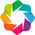

Imported v0.1.58. After importing, execute '%matplotlib inline' to display charts in Jupyter.
    AV = AutoViz_Class()
    dfte = AV.AutoViz(filename, sep=',', depVar='', dfte=None, header=0, verbose=1, lowess=False,
               chart_format='svg',max_rows_analyzed=150000,max_cols_analyzed=30, save_plot_dir=None)
Update: verbose=0 displays charts in your local Jupyter notebook.
        verbose=1 additionally provides EDA data cleaning suggestions. It also displays charts.
        verbose=2 does not display charts but saves them in AutoViz_Plots folder in local machine.
        chart_format='bokeh' displays charts in your local Jupyter notebook.
        chart_format='server' displays charts in your browser: one tab for each chart type
        chart_format='html' silently saves interactive HTML files in your local machine


In [20]:
from autoviz import data_cleaning_suggestions

In [21]:
data_cleaning_suggestions(df)

Data cleaning improvement suggestions. Complete them before proceeding to ML modeling.


,Nuniques,dtype,Nulls,Nullpercent,NuniquePercent,Value counts Min,Data cleaning improvement suggestions
Prospect ID,9240,object,0,0.000000,100.000000,1,"combine rare categories, possible ID column: drop"
Lead Number,9240,int64,0,0.000000,100.000000,0,possible ID column: drop
Total Time Spent on Website,1731,int64,0,0.000000,18.733766,0,
Page Views Per Visit,114,float64,137,1.482684,1.233766,0,"fill missing, skewed: cap or drop outliers"
TotalVisits,41,float64,137,1.482684,0.443723,0,"fill missing, highly skewed: drop outliers or do box-cox transform"
Country,38,object,2461,26.634199,0.411255,1,"combine rare categories, fill missing, fix mixed data types"
Tags,26,object,3353,36.287879,0.281385,1,"combine rare categories, fill missing, fix mixed data types"
Lead Source,21,object,36,0.389610,0.227273,1,"combine rare categories, fill missing, fix mixed data types"
Specialization,19,object,1438,15.562771,0.205628,40,"fill missing, fix mixed data types"
Last Activity,17,object,103,1.114719,0.183983,1,"fill missing, fix mixed data types"


In [22]:
from autoviz.AutoViz_Class import AutoViz_Class

#Instantiate the AutoViz class
AV = AutoViz_Class()

%matplotlib inline


## # filename ="Leads.csv"
sep= ","
dfte = AV.AutoViz(filename, sep=',', depVar='', dfte=None, header=0, verbose=1, lowess=True,
               chart_format='svg',max_rows_analyzed=150000,max_cols_analyzed=30, save_plot_dir=None)

### Data Cleaning & Exploratiory Analysis

- From the problem statement, it is clear to understand that Many of the categorical variables have a level called 'Select'
- which needs to be handled because it is as good as a null value. hence 'Select' can be converted to Null.

In [23]:

df = df.replace('Select', np.nan)

## converted all Select to nan

In [24]:
(df.isnull().sum()/df.shape[0]*100).sort_values(ascending = False)

How did you hear about X Education               78.463203
Lead Profile                                     74.188312
Lead Quality                                     51.590909
Asymmetrique Profile Score                       45.649351
Asymmetrique Activity Score                      45.649351
Asymmetrique Activity Index                      45.649351
Asymmetrique Profile Index                       45.649351
City                                             39.707792
Specialization                                   36.580087
Tags                                             36.287879
What matters most to you in choosing a course    29.318182
What is your current occupation                  29.112554
Country                                          26.634199
Page Views Per Visit                              1.482684
TotalVisits                                       1.482684
Last Activity                                     1.114719
Lead Source                                       0.3896

#### droping the features with more then 40% missing values

In [25]:
df= df.drop(df.columns[df.isnull().mean() >= 0.40], axis = 1)

In [26]:
(df.isnull().sum()/df.shape[0]*100).sort_values(ascending = False)

City                                             39.707792
Specialization                                   36.580087
Tags                                             36.287879
What matters most to you in choosing a course    29.318182
What is your current occupation                  29.112554
Country                                          26.634199
Page Views Per Visit                              1.482684
TotalVisits                                       1.482684
Last Activity                                     1.114719
Lead Source                                       0.389610
Through Recommendations                           0.000000
Receive More Updates About Our Courses            0.000000
Prospect ID                                       0.000000
Newspaper                                         0.000000
Update me on Supply Chain Content                 0.000000
Get updates on DM Content                         0.000000
I agree to pay the amount through cheque          0.0000

In [27]:
df.head()

,Prospect ID,Lead Number,Lead Origin,Lead Source,Do Not Email,Do Not Call,Converted,TotalVisits,Total Time Spent on Website,Page Views Per Visit,Last Activity,Country,Specialization,What is your current occupation,What matters most to you in choosing a course,Search,Magazine,Newspaper Article,X Education Forums,Newspaper,Digital Advertisement,Through Recommendations,Receive More Updates About Our Courses,Tags,Update me on Supply Chain Content,Get updates on DM Content,City,I agree to pay the amount through cheque,A free copy of Mastering The Interview,Last Notable Activity
0,7927b2df-8bba-4d29-b9a2-b6e0beafe620,660737,API,Olark Chat,No,No,0,0.0,0,0.0,Page Visited on Website,NaN,NaN,Unemployed,Better Career Prospects,No,No,No,No,No,No,No,No,Interested in other courses,No,No,NaN,No,No,Modified
1,2a272436-5132-4136-86fa-dcc88c88f482,660728,API,Organic Search,No,No,0,5.0,674,2.5,Email Opened,India,NaN,Unemployed,Better Career Prospects,No,No,No,No,No,No,No,No,Ringing,No,No,NaN,No,No,Email Opened
2,8cc8c611-a219-4f35-ad23-fdfd2656bd8a,660727,Landing Page Submission,Direct Traffic,No,No,1,2.0,1532,2.0,Email Opened,India,Business Administration,Student,Better Career Prospects,No,No,No,No,No,No,No,No,Will revert after reading the email,No,No,Mumbai,No,Yes,Email Opened
3,0cc2df48-7cf4-4e39-9de9-19797f9b38cc,660719,Landing Page Submission,Direct Traffic,No,No,0,1.0,305,1.0,Unreachable,India,Media and Advertising,Unemployed,Better Career Prospects,No,No,No,No,No,No,No,No,Ringing,No,No,Mumbai,No,No,Modified
4,3256f628-e534-4826-9d63-4a8b88782852,660681,Landing Page Submission,Google,No,No,1,2.0,1428,1.0,Converted to Lead,India,NaN,Unemployed,Better Career Prospects,No,No,No,No,No,No,No,No,Will revert after reading the email,No,No,Mumbai,No,No,Modified


#### Droping the features which has no imprtance to model building
- 'Prospect ID','Lead Number'have only id of prospects which are not helpful
- 'Receive More Updates About Our Courses','Update me on Supply Chain Content', 'Get updates on DM Content',
    'Magazine','I agree to pay the amount through cheque' have only 1 unique value which again is not helpful for further analysis

In [28]:
df = df.drop(columns=['Prospect ID','Lead Number','Receive More Updates About Our Courses','Update me on Supply Chain Content', 'Get updates on DM Content',
                     'Magazine','I agree to pay the amount through cheque'])

In [29]:
df.shape

(9240, 23)

- after removing the features with more then 40% missing values and reduntant features we are left with 23 features

In [30]:
(df.isnull().sum()/df.shape[0]*100).sort_values(ascending = False)

City                                             39.707792
Specialization                                   36.580087
Tags                                             36.287879
What matters most to you in choosing a course    29.318182
What is your current occupation                  29.112554
Country                                          26.634199
TotalVisits                                       1.482684
Page Views Per Visit                              1.482684
Last Activity                                     1.114719
Lead Source                                       0.389610
X Education Forums                                0.000000
A free copy of Mastering The Interview            0.000000
Through Recommendations                           0.000000
Digital Advertisement                             0.000000
Newspaper                                         0.000000
Lead Origin                                       0.000000
Newspaper Article                                 0.0000

In [31]:
df.nunique()

Lead Origin                                         5
Lead Source                                        21
Do Not Email                                        2
Do Not Call                                         2
Converted                                           2
TotalVisits                                        41
Total Time Spent on Website                      1731
Page Views Per Visit                              114
Last Activity                                      17
Country                                            38
Specialization                                     18
What is your current occupation                     6
What matters most to you in choosing a course       3
Search                                              2
Newspaper Article                                   2
X Education Forums                                  2
Newspaper                                           2
Digital Advertisement                               2
Through Recommendations     

#### Treating null & missing values`

- first will treat columns having more than 25% missing values

In [32]:
# List the columns having more than 25% missing values
cols_25_percent_missing_values = (df.columns[(round(100*(df.isnull().sum()/len(df.index)), 2)) >= 25]).tolist()
cols_25_percent_missing_values

['Country',
 'Specialization',
 'What is your current occupation',
 'What matters most to you in choosing a course',
 'Tags',
 'City']

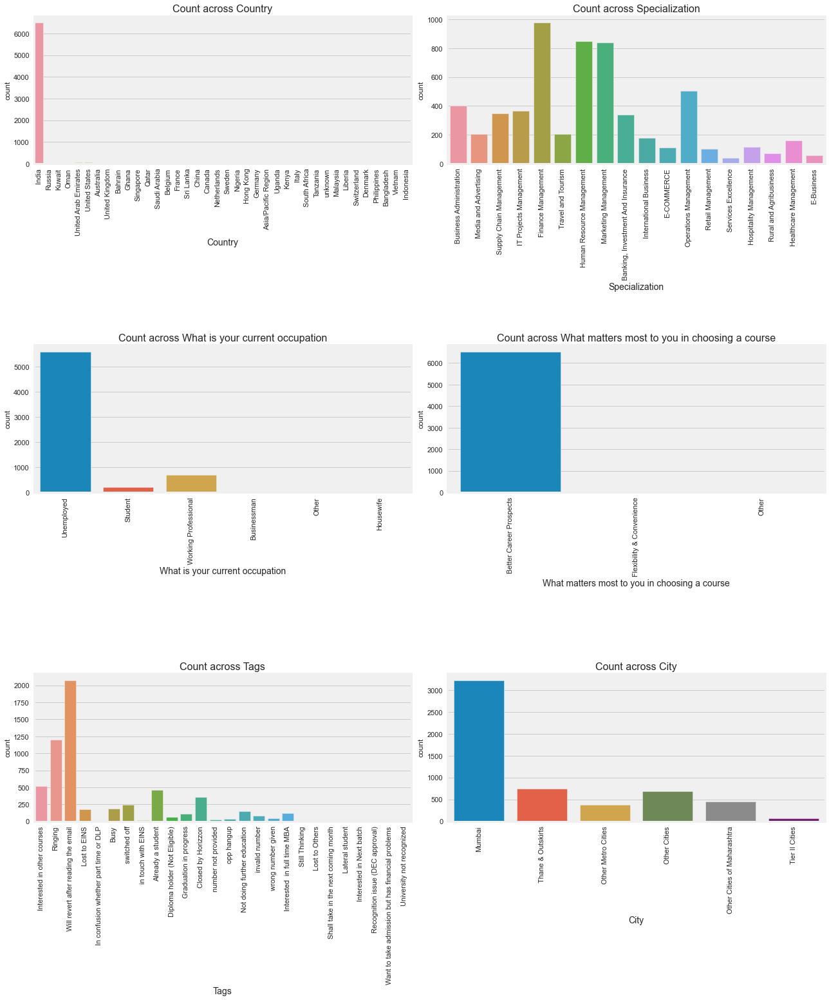

In [33]:
def countplot(x, fig):
    plt.subplot(4,2, fig)
    sns.countplot(df[x])
    plt.title('Count across'+' '+ x, size = 16)
    plt.xlabel(x,size = 14)
    plt.xticks(rotation = 90)

plt.figure(figsize=(18,25))


countplot('Country',1)
countplot('Specialization',2)
countplot('What is your current occupation',3)
countplot('What matters most to you in choosing a course',4)
countplot('Tags',5)
countplot('City',6)

plt.tight_layout()

- we are also doing vizualization on basis of traget variable

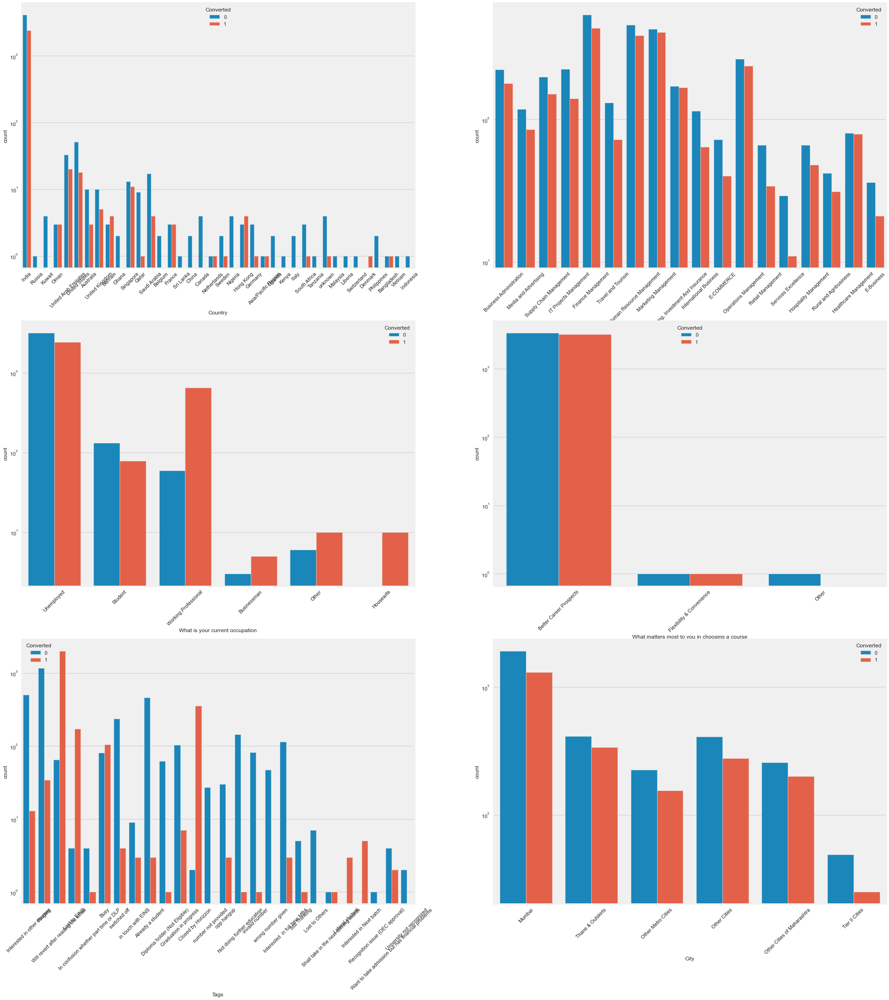

In [34]:
cat =['Country',
 'Specialization',
 'What is your current occupation',
 'What matters most to you in choosing a course',
 'Tags',
 'City']
plt.figure(figsize=(30,36))
for i in (enumerate(cat)):
    plt.subplot(len(cat)//2,2,i[0]+1)
    sns.countplot(x=i[1],hue='Converted',data=df)
    plt.yscale('log')
    plt.xticks(rotation=45)
plt.show()

In [35]:
df.Country.value_counts()

India                   6492
United States             69
United Arab Emirates      53
Singapore                 24
Saudi Arabia              21
United Kingdom            15
Australia                 13
Qatar                     10
Hong Kong                  7
Bahrain                    7
Oman                       6
France                     6
unknown                    5
South Africa               4
Nigeria                    4
Germany                    4
Kuwait                     4
Canada                     4
Sweden                     3
China                      2
Asia/Pacific Region        2
Uganda                     2
Bangladesh                 2
Italy                      2
Belgium                    2
Netherlands                2
Ghana                      2
Philippines                2
Russia                     1
Switzerland                1
Vietnam                    1
Denmark                    1
Tanzania                   1
Liberia                    1
Malaysia      

In [36]:
df.Tags.value_counts()

Will revert after reading the email                  2072
Ringing                                              1203
Interested in other courses                           513
Already a student                                     465
Closed by Horizzon                                    358
switched off                                          240
Busy                                                  186
Lost to EINS                                          175
Not doing further education                           145
Interested  in full time MBA                          117
Graduation in progress                                111
invalid number                                         83
Diploma holder (Not Eligible)                          63
wrong number given                                     47
opp hangup                                             33
number not provided                                    27
in touch with EINS                                     12
Lost to Others

#### 
- Droping features Country- as most of the data points from India and can be create biaseness in the analysis
- From the count plot of `city`, we can see that maximum leads are from `Mumbai`.
- For Most of the leads, having `better career prospects`, matters the most while choosing a course. 
- The current occupation of maximum number of leads is `Unemployed`.
- Majority of the leads are `specialised` in `Finance Management`, followed by Human Resource & Manufacturing Management


In [37]:
df.columns

Index(['Lead Origin', 'Lead Source', 'Do Not Email', 'Do Not Call', 'Converted', 'TotalVisits', 'Total Time Spent on Website', 'Page Views Per Visit', 'Last Activity', 'Country', 'Specialization', 'What is your current occupation', 'What matters most to you in choosing a course', 'Search', 'Newspaper Article', 'X Education Forums', 'Newspaper', 'Digital Advertisement', 'Through Recommendations', 'Tags', 'City', 'A free copy of Mastering The Interview', 'Last Notable Activity'], dtype='object')

- Droping variable Country to avoid biasness

In [38]:
df = df.drop(columns=['Country'])

In [39]:
df.shape

(9240, 22)

In [40]:
df['What matters most to you in choosing a course'].value_counts(dropna=False)

Better Career Prospects      6528
NaN                          2709
Flexibility & Convenience       2
Other                           1
Name: What matters most to you in choosing a course, dtype: int64

In [41]:
df['City'].value_counts(dropna=False)

NaN                            3669
Mumbai                         3222
Thane & Outskirts               752
Other Cities                    686
Other Cities of Maharashtra     457
Other Metro Cities              380
Tier II Cities                   74
Name: City, dtype: int64

- Treating current occupation

In [42]:
df['What is your current occupation'].value_counts(dropna=False)

Unemployed              5600
NaN                     2690
Working Professional     706
Student                  210
Other                     16
Housewife                 10
Businessman                8
Name: What is your current occupation, dtype: int64

In [43]:
df['What is your current occupation']=df['What is your current occupation'].replace(np.nan,'Unemployed')

In [44]:
df['What is your current occupation'].value_counts(dropna=False,normalize=True)*100

Unemployed              89.718615
Working Professional     7.640693
Student                  2.272727
Other                    0.173160
Housewife                0.108225
Businessman              0.086580
Name: What is your current occupation, dtype: float64

- Treatingg Choosing course

In [45]:
df['What matters most to you in choosing a course']=df['What matters most to you in choosing a course'].replace(np.nan,'Better Career Prospects')

In [46]:
df['What matters most to you in choosing a course'].value_counts(dropna=False,normalize=True)*100

Better Career Prospects      99.967532
Flexibility & Convenience     0.021645
Other                         0.010823
Name: What matters most to you in choosing a course, dtype: float64

In [47]:
df = df.drop(columns=['What matters most to you in choosing a course'])

- as What matters most to you in choosing a course data is very skwed and highly biased we have droped the feature

- Replacing nan in City with Mumbai

In [48]:
df['City']=df['City'].replace(np.nan,'Mumbai')

In [49]:
df['City'].value_counts(dropna=False,normalize=True)*100

Mumbai                         74.577922
Thane & Outskirts               8.138528
Other Cities                    7.424242
Other Cities of Maharashtra     4.945887
Other Metro Cities              4.112554
Tier II Cities                  0.800866
Name: City, dtype: float64

- Treating Specialization
- first for minimal value counts we will club them
- later will replace the Nan values

In [50]:
df['Specialization'].value_counts(dropna=False,normalize=True)*100

NaN                                  36.580087
Finance Management                   10.562771
Human Resource Management             9.177489
Marketing Management                  9.069264
Operations Management                 5.443723
Business Administration               4.361472
IT Projects Management                3.961039
Supply Chain Management               3.777056
Banking, Investment And Insurance     3.658009
Travel and Tourism                    2.196970
Media and Advertising                 2.196970
International Business                1.926407
Healthcare Management                 1.720779
Hospitality Management                1.233766
E-COMMERCE                            1.212121
Retail Management                     1.082251
Rural and Agribusiness                0.790043
E-Business                            0.616883
Services Excellence                   0.432900
Name: Specialization, dtype: float64

In [51]:
#Since Management is an import metric insde Specialisation, we could combine the entire Managements under one umbrella
# We will call this combo as Management_Specializations

df['Specialization'] = df['Specialization'].replace(['Finance Management','Human Resource Management',
                                                           'Marketing Management','Operations Management',
                                                           'IT Projects Management','Supply Chain Management',
                                                    'Healthcare Management','Hospitality Management',
                                                           'Retail Management'] ,'Management_Specializations') 

In [52]:
# There seems to be a scenario in this variable.
#Some customer may not have mentioned specialization as it was not in the list or there aren't any 
# Hence we can impute the NA's as 'Not Specified'

df['Specialization'] = df['Specialization'].replace(np.nan, 'Not Specified')

In [53]:
df['Specialization'].value_counts(dropna=False,normalize=True)*100

Management_Specializations           46.028139
Not Specified                        36.580087
Business Administration               4.361472
Banking, Investment And Insurance     3.658009
Media and Advertising                 2.196970
Travel and Tourism                    2.196970
International Business                1.926407
E-COMMERCE                            1.212121
Rural and Agribusiness                0.790043
E-Business                            0.616883
Services Excellence                   0.432900
Name: Specialization, dtype: float64

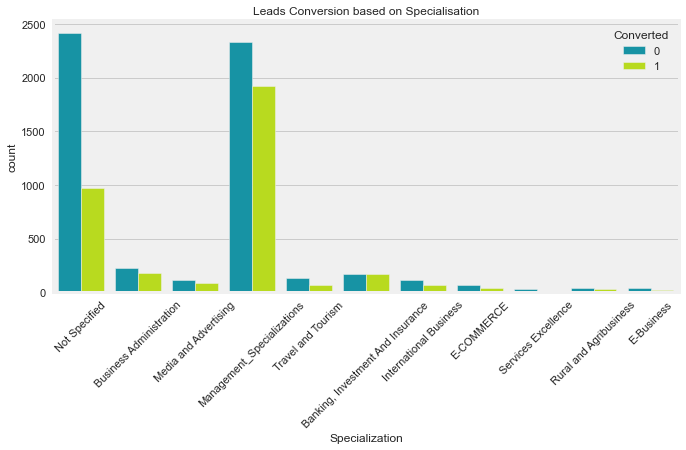

In [54]:
#plotting Specialization column after consolidating the Management Sepcializations

#Setting the frame
plt.figure(figsize=(10,5))

#Visualising using Countplot

count_fig=sns.countplot(df['Specialization'], hue=df['Converted'],palette='nipy_spectral')
count_fig.set_xticklabels(count_fig.get_xticklabels(),rotation=45)

#Formatting the plot
plt.title("Leads Conversion based on Specialisation",fontsize=12)
plt.show()

- Treating Tags
- first for minimal value counts we will merge them
- later will replace the Nan values

In [55]:
df['Tags'].value_counts(dropna=False,normalize=True)*100

NaN                                                  36.287879
Will revert after reading the email                  22.424242
Ringing                                              13.019481
Interested in other courses                           5.551948
Already a student                                     5.032468
Closed by Horizzon                                    3.874459
switched off                                          2.597403
Busy                                                  2.012987
Lost to EINS                                          1.893939
Not doing further education                           1.569264
Interested  in full time MBA                          1.266234
Graduation in progress                                1.201299
invalid number                                        0.898268
Diploma holder (Not Eligible)                         0.681818
wrong number given                                    0.508658
opp hangup                                            0

In [56]:
df['Tags'] = df['Tags'].replace(np.nan,'Not Specified')

In [57]:
df['Tags'] = df['Tags'].replace(['In confusion whether part time or DLP', 'in touch with EINS','Diploma holder (Not Eligible)',
                                     'Approached upfront','Graduation in progress','number not provided', 'opp hangup','Still Thinking',
                                    'Lost to Others','Shall take in the next coming month','Lateral student','Interested in Next batch',
                                    'Recognition issue (DEC approval)','Want to take admission but has financial problems',
                                    'University not recognized','switched off','Already a student','Not doing further education',
                                     'invalid number','wrong number given','Interested  in full time MBA'], 'Other_Tags')

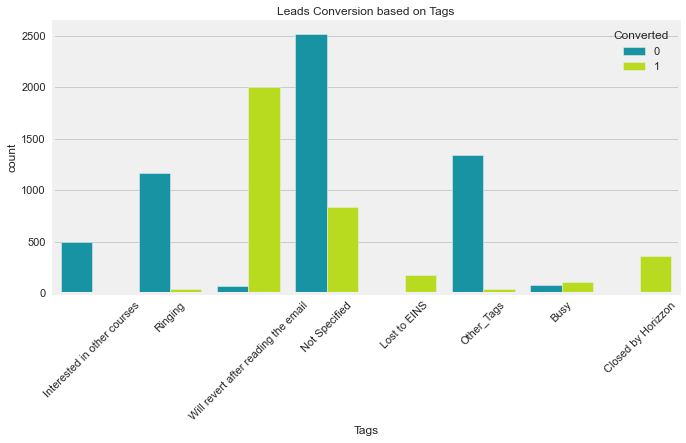

In [58]:


plt.figure(figsize=(10,5))

#Visualising using Countplot

count_fig=sns.countplot(df['Tags'], hue=df['Converted'],palette='nipy_spectral')
count_fig.set_xticklabels(count_fig.get_xticklabels(),rotation=45)

#Formatting the plot
plt.title("Leads Conversion based on Tags",fontsize=12)
plt.show()

In [59]:
df['Tags'].value_counts(dropna=False,normalize=True)*100

Not Specified                          36.287879
Will revert after reading the email    22.424242
Other_Tags                             14.935065
Ringing                                13.019481
Interested in other courses             5.551948
Closed by Horizzon                      3.874459
Busy                                    2.012987
Lost to EINS                            1.893939
Name: Tags, dtype: float64

In [60]:
df.isnull().sum()

Lead Origin                                 0
Lead Source                                36
Do Not Email                                0
Do Not Call                                 0
Converted                                   0
TotalVisits                               137
Total Time Spent on Website                 0
Page Views Per Visit                      137
Last Activity                             103
Specialization                              0
What is your current occupation             0
Search                                      0
Newspaper Article                           0
X Education Forums                          0
Newspaper                                   0
Digital Advertisement                       0
Through Recommendations                     0
Tags                                        0
City                                        0
A free copy of Mastering The Interview      0
Last Notable Activity                       0
dtype: int64

#### EDA on features with less the 25% missing Values- Catagorical Variables

In [61]:
cols_less_then_25_percent_missing_values = (df.columns[(round(100*(df.isnull().sum()/len(df.index)), 2)) < 25]).tolist()
cols_less_then_25_percent_missing_values

['Lead Origin',
 'Lead Source',
 'Do Not Email',
 'Do Not Call',
 'Converted',
 'TotalVisits',
 'Total Time Spent on Website',
 'Page Views Per Visit',
 'Last Activity',
 'Specialization',
 'What is your current occupation',
 'Search',
 'Newspaper Article',
 'X Education Forums',
 'Newspaper',
 'Digital Advertisement',
 'Through Recommendations',
 'Tags',
 'City',
 'A free copy of Mastering The Interview',
 'Last Notable Activity']

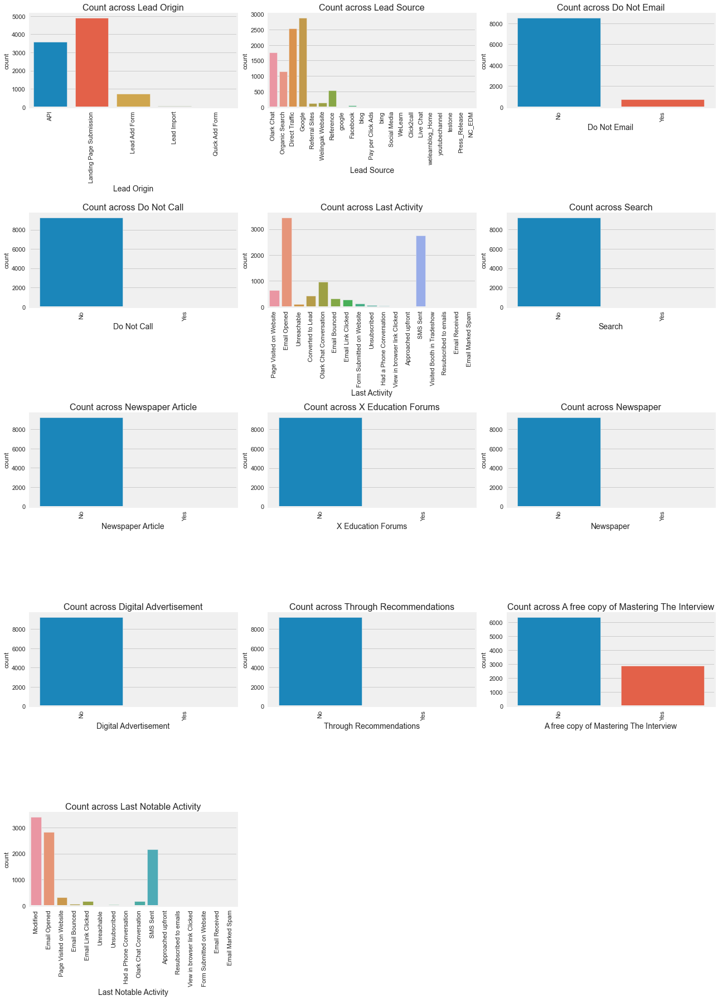

In [62]:
def countplot(x, fig):
    plt.subplot(5,3, fig)
    sns.countplot(df[x])
    plt.title('Count across'+' '+ x, size = 16)
    plt.xlabel(x,size = 14)
    plt.xticks(rotation = 90)

plt.figure(figsize=(18,25))


countplot('Lead Origin',1)
countplot('Lead Source',2)
countplot('Do Not Email',3)
countplot('Do Not Call',4)
countplot('Last Activity',5)
countplot('Search',6)
countplot('Newspaper Article',7)
countplot('X Education Forums',8)
countplot('Newspaper',9)
countplot('Digital Advertisement',10)
countplot('Through Recommendations',11)
countplot('A free copy of Mastering The Interview',12)
countplot('Last Notable Activity',13)


plt.tight_layout()

#### Observations-
- Features Through Reccomedations, Digital Advertisment, Newspaper, Education forums, Search, Dont not call, Newpaper Artical 
- these columus are skwed or have unbalance data which will craete biasness hence we are droping these features
- Features Lead source have Google and google which we will replace with Google
- we will combine and create group with in features to remove any biasness 
- further will treat features Lead Source, Last Activity, Last Notable Activity and count across lead origin

In [63]:
## droping variables to avoid biasness in analysis

df = df.drop(columns=['Do Not Call', 'Search','Newspaper Article', 'X Education Forums','Newspaper',
                      'Digital Advertisement', 'Through Recommendations'])

In [64]:
df.shape

(9240, 14)

In [65]:
df['Lead Source'].value_counts(dropna=False,normalize=True)*100

Google               31.038961
Direct Traffic       27.521645
Olark Chat           18.993506
Organic Search       12.489177
Reference             5.779221
Welingak Website      1.536797
Referral Sites        1.352814
Facebook              0.595238
NaN                   0.389610
bing                  0.064935
google                0.054113
Click2call            0.043290
Press_Release         0.021645
Social Media          0.021645
Live Chat             0.021645
youtubechannel        0.010823
testone               0.010823
Pay per Click Ads     0.010823
welearnblog_Home      0.010823
WeLearn               0.010823
blog                  0.010823
NC_EDM                0.010823
Name: Lead Source, dtype: float64

In [66]:
df['Lead Source'] = df['Lead Source'].replace(np.nan,'Others')

#Also we can combining low frequency values present in the Lead Source

df['Lead Source'] = df['Lead Source'].replace('google','Google')
df['Lead Source'] = df['Lead Source'].replace('Facebook','Social Media')
df['Lead Source'] = df['Lead Source'].replace(['bing','Click2call','Press_Release',
                                                     'youtubechannel','welearnblog_Home',
                                                     'WeLearn','blog','Pay per Click Ads',
                                                    'testone','NC_EDM'] ,'Others')

- Most of the leads generated are through Google and Direct traffic and the least through Live Chat
- Welingak website ahs the most conversion rate
- Lead conversion can be improved by maxising leads from Reference and welingak website
- Focussing Olark chat, Organic search, Direct traffic, and google leads may increase the lead conversion

In [67]:
df['Lead Source'].value_counts(dropna=False,normalize=True)*100

Google              31.093074
Direct Traffic      27.521645
Olark Chat          18.993506
Organic Search      12.489177
Reference            5.779221
Welingak Website     1.536797
Referral Sites       1.352814
Social Media         0.616883
Others               0.595238
Live Chat            0.021645
Name: Lead Source, dtype: float64

In [68]:
df['Last Activity'].value_counts(dropna=False,normalize=True)*100

Email Opened                    37.196970
SMS Sent                        29.707792
Olark Chat Conversation         10.530303
Page Visited on Website          6.926407
Converted to Lead                4.632035
Email Bounced                    3.528139
Email Link Clicked               2.889610
Form Submitted on Website        1.255411
NaN                              1.114719
Unreachable                      1.006494
Unsubscribed                     0.660173
Had a Phone Conversation         0.324675
Approached upfront               0.097403
View in browser link Clicked     0.064935
Email Received                   0.021645
Email Marked Spam                0.021645
Visited Booth in Tradeshow       0.010823
Resubscribed to emails           0.010823
Name: Last Activity, dtype: float64

In [69]:
df['Last Activity'] = df['Last Activity'].replace(np.nan,'Others')

#replacing categories which are less than 1% to Others as it does not make much impact for analysis

df['Last Activity'] = df['Last Activity'].replace(['Unreachable','Unsubscribed',
                                                        'Had a Phone Conversation', 
                                                        'Approached upfront',
                                                        'View in browser link Clicked',       
                                                        'Email Marked Spam',                  
                                                        'Email Received','Resubscribed to emails',
                                                         'Visited Booth in Tradeshow'],'Others')

In [70]:
df['Last Activity'].value_counts(dropna=False,normalize=True)*100

Email Opened                 37.196970
SMS Sent                     29.707792
Olark Chat Conversation      10.530303
Page Visited on Website       6.926407
Converted to Lead             4.632035
Email Bounced                 3.528139
Others                        3.333333
Email Link Clicked            2.889610
Form Submitted on Website     1.255411
Name: Last Activity, dtype: float64

In [71]:
df['Last Notable Activity'].value_counts(dropna=False,normalize=True)*100

Modified                        36.872294
Email Opened                    30.595238
SMS Sent                        23.506494
Page Visited on Website          3.441558
Olark Chat Conversation          1.980519
Email Link Clicked               1.872294
Email Bounced                    0.649351
Unsubscribed                     0.508658
Unreachable                      0.346320
Had a Phone Conversation         0.151515
Email Marked Spam                0.021645
Approached upfront               0.010823
Resubscribed to emails           0.010823
View in browser link Clicked     0.010823
Form Submitted on Website        0.010823
Email Received                   0.010823
Name: Last Notable Activity, dtype: float64

In [72]:
#We can consolidate the categories that has less than 1% occurance on the Last Notable Activity

df['Last Notable Activity'] = df['Last Notable Activity'].replace(['Had a Phone Conversation','Email Marked Spam',
                                                                       'Unreachable','Unsubscribed','Email Bounced',
                                                                       'Resubscribed to emails','View in browser link Clicked',
                                                                       'Approached upfront', 'Form Submitted on Website',
                                                                       'Email Received'],'Other_Notable_activity')

In [73]:
df['Last Notable Activity'].value_counts(dropna=False,normalize=True)*100

Modified                   36.872294
Email Opened               30.595238
SMS Sent                   23.506494
Page Visited on Website     3.441558
Olark Chat Conversation     1.980519
Email Link Clicked          1.872294
Other_Notable_activity      1.731602
Name: Last Notable Activity, dtype: float64

In [74]:
df['Lead Origin'].value_counts(dropna=False,normalize=True)*100

Landing Page Submission    52.878788
API                        38.744589
Lead Add Form               7.770563
Lead Import                 0.595238
Quick Add Form              0.010823
Name: Lead Origin, dtype: float64

- API and Landing Page Submission bring more number of leads as well as conversion.
- Lead Add Form has a very high conversion rate but count of leads are not very high.
- If Lead add form could get more leads, then the rate of conversion can be very high and for overall growth

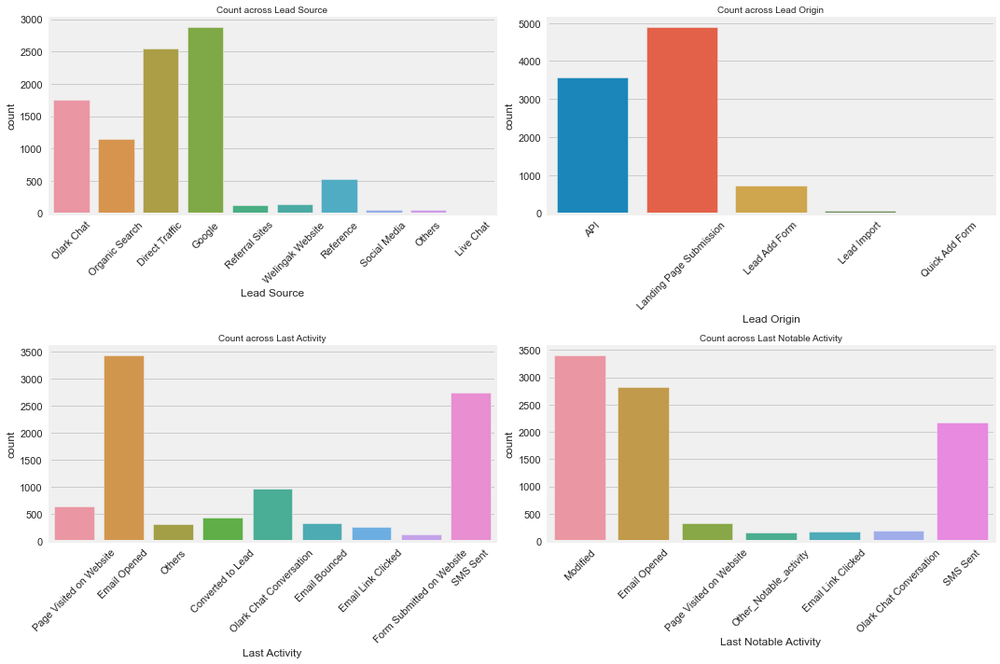

In [75]:
def countplot(x, fig):
    plt.subplot(2,2, fig)
    sns.countplot(df[x])
    plt.title('Count across'+' '+ x, size = 10)
    plt.xlabel(x,size = 12)
    plt.xticks(rotation = 45)

plt.figure(figsize=(15,10))

countplot('Lead Source',1)
countplot('Lead Origin',2)
countplot('Last Activity',3)
countplot('Last Notable Activity',4)


plt.tight_layout()

In [76]:
# Dropping the Last Notable Activity as it is mostly same Last Activity

df.drop('Last Notable Activity',1,inplace=True)

#### Observations
- droped the variable Last notable Activity as it is very much same as last activity which could have resulted in biasness
- Page visited on website is most comman activity
- Google is main lead source
- landing page submission and API are major source of lead generation
-
-

In [77]:
(df.isnull().sum()/df.shape[0]*100).sort_values(ascending = False)

TotalVisits                               1.482684
Page Views Per Visit                      1.482684
Lead Origin                               0.000000
Lead Source                               0.000000
Do Not Email                              0.000000
Converted                                 0.000000
Total Time Spent on Website               0.000000
Last Activity                             0.000000
Specialization                            0.000000
What is your current occupation           0.000000
Tags                                      0.000000
City                                      0.000000
A free copy of Mastering The Interview    0.000000
dtype: float64

### Treating Numerical Features & Outliers

In [78]:
df.shape

(9240, 13)

- as we have total null values remaining less the 1.5%, hence will drop the rows and see how much data we will lost

In [79]:
df= df.dropna()

In [80]:
df.shape

(9103, 13)

- after droping the null values we havent lost the much data so now will procced to treat the ouliers

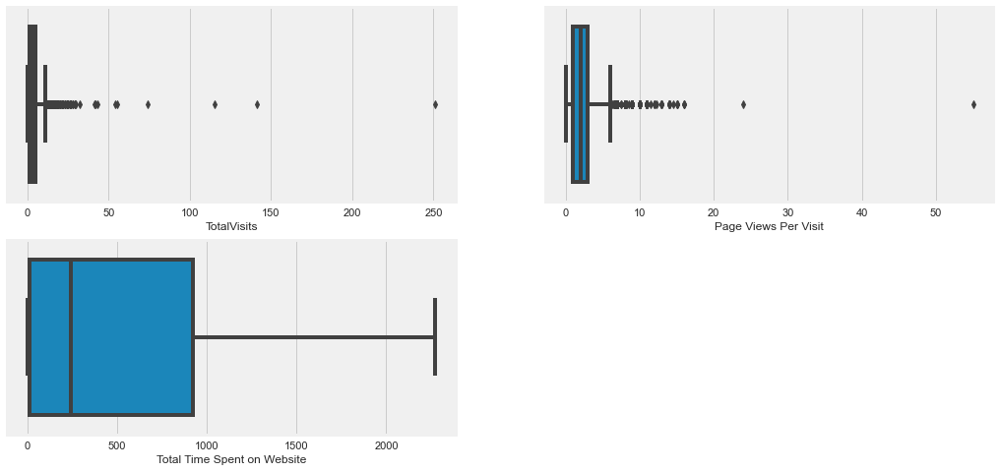

In [81]:
# Finding the outliers
plt.figure(figsize = (16,8))
plt.subplot(2,2,1)
sns.boxplot(df['TotalVisits'])
plt.subplot(2,2,2)
sns.boxplot(df['Page Views Per Visit'])
plt.subplot(2,2,3)
sns.boxplot(df['Total Time Spent on Website'])
plt.xlabel('Total Time Spent on Website')
plt.show()

#### Observation
- Outliers in Total Visits no oiutliers towards lower end
- Outliers in Page views per Visit no oiutliers towards lower end
- No outliers in Total time spent

In [82]:
### checking the median before treating the outliers

print ('Median of TotalVisits is', df['TotalVisits'].median())
print ('Median of Page Views Per Visit', df['Page Views Per Visit'].median())

Median of TotalVisits is 3.0
Median of Page Views Per Visit 2.0


- Checking quantile to treat outliers

In [83]:
df.TotalVisits.quantile([0.20,0.4,0.6,0.8,0.99,1])

0.20      0.0
0.40      2.0
0.60      3.0
0.80      5.0
0.99     17.0
1.00    251.0
Name: TotalVisits, dtype: float64

In [84]:
df['Page Views Per Visit'].quantile([0.20,0.4,0.6,0.8,0.99,1])

0.20     0.0
0.40     2.0
0.60     2.5
0.80     4.0
0.99     9.0
1.00    55.0
Name: Page Views Per Visit, dtype: float64

- Keeping outliers cap at 99 percentile

In [85]:
Q3 = df['Page Views Per Visit'].quantile(0.99)

df = df[(df['Page Views Per Visit'] <= Q3)]

In [86]:
Q3 = df['TotalVisits'].quantile(0.99)

df = df[(df['TotalVisits'] <= Q3)]

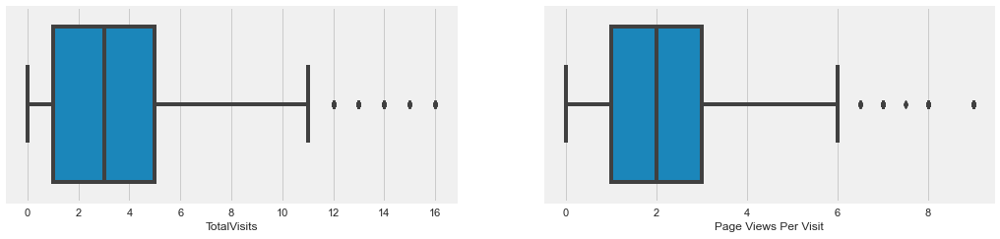

In [87]:
## reploting after the oultier treatment

plt.figure(figsize = (16,8))
plt.subplot(2,2,1)
sns.boxplot(df['TotalVisits'])
plt.subplot(2,2,2)
sns.boxplot(df['Page Views Per Visit'])
plt.show()

After treating the outliers
- total visit has been caped to 16 / 99%
- Pages views per visit has been capped to 9 / 99%

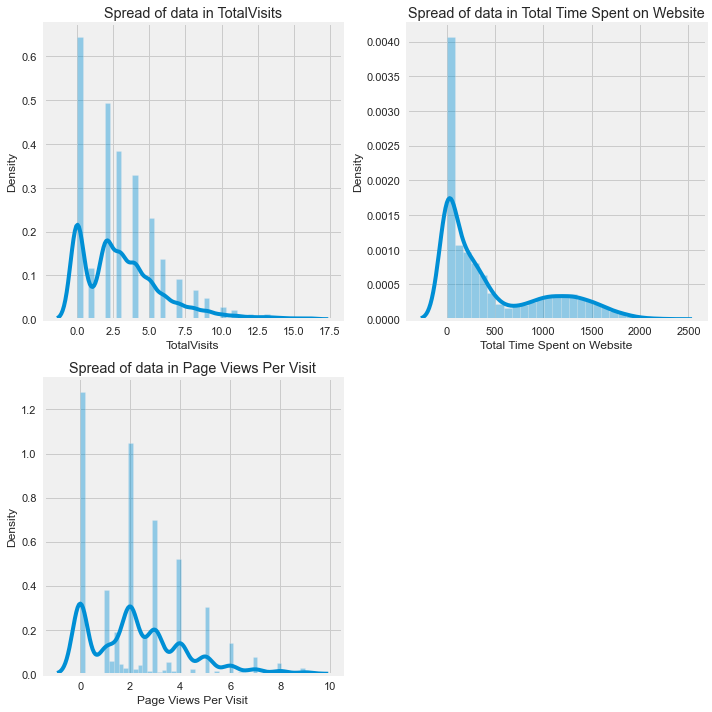

In [88]:
#Lets see the spread of the data


def spread(x, fig):
    plt.subplot(2,2,fig) 
    sns.distplot(df[x])
    plt.title('Spread of data in'+' '+ x)
    plt.xlabel(x)

    
plt.figure(figsize=(10,10))

spread('TotalVisits',1)
spread('Total Time Spent on Website',2)
spread('Page Views Per Visit',3)

plt.tight_layout()

- ContinuousVariables are not in Normaly distributed
- We can see that the total visits have more dense in between 0-5
- page views per visits 0-2

In [89]:
df['Converted'].value_counts(normalize=True)*100

0    62.03424
1    37.96576
Name: Converted, dtype: float64

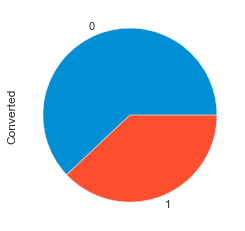

In [90]:

(df.Converted.value_counts(normalize=True)/ len(df)).plot.pie()
plt.xticks(rotation=0)
plt.show()

- rate of conversion is approx 38%

### Checking correlation betweenn numerical variables

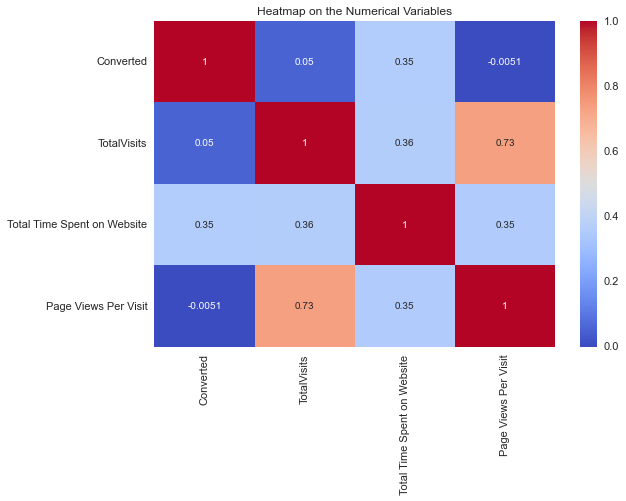

In [91]:
#Setting the frame
plt.figure(figsize=(8,6))

# heatmap
sns.heatmap(df.corr(), cmap="coolwarm", annot=True)
plt.title("Heatmap on the Numerical Variables",fontsize=12)
plt.show()

In [92]:
df.corr()

,Converted,TotalVisits,Total Time Spent on Website,Page Views Per Visit
Converted,1.000000,0.049874,0.352591,-0.005068
TotalVisits,0.049874,1.000000,0.357874,0.729901
Total Time Spent on Website,0.352591,0.357874,1.000000,0.351376
Page Views Per Visit,-0.005068,0.729901,0.351376,1.000000


Observations-
- Page view per visits have strong correlation with Total Visits
- Time spent on website have 35% effect on lead conversion
- Total vistis and time have 36% effect on leads

### Data preparation for Modelling

In [93]:
df.columns

Index(['Lead Origin', 'Lead Source', 'Do Not Email', 'Converted', 'TotalVisits', 'Total Time Spent on Website', 'Page Views Per Visit', 'Last Activity', 'Specialization', 'What is your current occupation', 'Tags', 'City', 'A free copy of Mastering The Interview'], dtype='object')

#### Creating Dummy Variables

In [94]:
categorical_vals= df.select_dtypes(include=['object']).columns
categorical_vals

Index(['Lead Origin', 'Lead Source', 'Do Not Email', 'Last Activity', 'Specialization', 'What is your current occupation', 'Tags', 'City', 'A free copy of Mastering The Interview'], dtype='object')

In [95]:
for i in categorical_vals:
    print(i)
    print(df[i].value_counts())
    print(" ")

Lead Origin
Landing Page Submission    4757
API                        3542
Lead Add Form               607
Lead Import                  31
Name: Lead Origin, dtype: int64
 
Lead Source
Google              2840
Direct Traffic      2492
Olark Chat          1749
Organic Search      1087
Reference            442
Welingak Website     129
Referral Sites       116
Others                47
Social Media          33
Live Chat              2
Name: Lead Source, dtype: int64
 
Do Not Email
No     8242
Yes     695
Name: Do Not Email, dtype: int64
 
Last Activity
Email Opened                 3387
SMS Sent                     2697
Olark Chat Conversation       965
Page Visited on Website       587
Converted to Lead             428
Email Bounced                 310
Email Link Clicked            264
Others                        186
Form Submitted on Website     113
Name: Last Activity, dtype: int64
 
Specialization
Management_Specializations           4115
Not Specified                        3281
Bus

In [96]:
# We can see that 'A free copy of Mastering The Interview','Do Not Email' has yes and no's which can 
#converted to 1's and 0's

df['A free copy of Mastering The Interview']=df['A free copy of Mastering The Interview'].apply(lambda x: 1 if x=='Yes' else 0)
df['Do Not Email']=df['Do Not Email'].apply(lambda x: 1 if x=='Yes' else 0)

In [97]:
df.head(3)

,Lead Origin,Lead Source,Do Not Email,Converted,TotalVisits,Total Time Spent on Website,Page Views Per Visit,Last Activity,Specialization,What is your current occupation,Tags,City,A free copy of Mastering The Interview
0,API,Olark Chat,0,0,0.0,0,0.0,Page Visited on Website,Not Specified,Unemployed,Interested in other courses,Mumbai,0
1,API,Organic Search,0,0,5.0,674,2.5,Email Opened,Not Specified,Unemployed,Ringing,Mumbai,0
2,Landing Page Submission,Direct Traffic,0,1,2.0,1532,2.0,Email Opened,Business Administration,Student,Will revert after reading the email,Mumbai,1


In [98]:
# Creating dummies of Categorical Variables

ddf = pd.get_dummies(data=df,columns=['Lead Origin', 'Lead Source', 'Do Not Email', 'Last Activity', 'Specialization', 'What is your current occupation', 'City', 'A free copy of Mastering The Interview','Tags'],drop_first=True)

In [99]:
ddf.head()

,Converted,TotalVisits,Total Time Spent on Website,Page Views Per Visit,Lead Origin_Landing Page Submission,Lead Origin_Lead Add Form,Lead Origin_Lead Import,Lead Source_Google,Lead Source_Live Chat,Lead Source_Olark Chat,Lead Source_Organic Search,Lead Source_Others,Lead Source_Reference,Lead Source_Referral Sites,Lead Source_Social Media,Lead Source_Welingak Website,Do Not Email_1,Last Activity_Email Bounced,Last Activity_Email Link Clicked,Last Activity_Email Opened,Last Activity_Form Submitted on Website,Last Activity_Olark Chat Conversation,Last Activity_Others,Last Activity_Page Visited on Website,Last Activity_SMS Sent,Specialization_Business Administration,Specialization_E-Business,Specialization_E-COMMERCE,Specialization_International Business,Specialization_Management_Specializations,Specialization_Media and Advertising,Specialization_Not Specified,Specialization_Rural and Agribusiness,Specialization_Services Excellence,Specialization_Travel and Tourism,What is your current occupation_Housewife,What is your current occupation_Other,What is your current occupation_Student,What is your current occupation_Unemployed,What is your current occupation_Working Professional,City_Other Cities,City_Other Cities of Maharashtra,City_Other Metro Cities,City_Thane & Outskirts,City_Tier II Cities,A free copy of Mastering The Interview_1,Tags_Closed by Horizzon,Tags_Interested in other courses,Tags_Lost to EINS,Tags_Not Specified,Tags_Other_Tags,Tags_Ringing,Tags_Will revert after reading the email
0,0,0.0,0,0.0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0
1,0,5.0,674,2.5,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0
2,1,2.0,1532,2.0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1
3,0,1.0,305,1.0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0
4,1,2.0,1428,1.0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1


In [100]:
ddf.shape

(8937, 53)

In [101]:
ddf.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 8937 entries, 0 to 9239
Data columns (total 53 columns):
 #   Column                                                Non-Null Count  Dtype  
---  ------                                                --------------  -----  
 0   Converted                                             8937 non-null   int64  
 1   TotalVisits                                           8937 non-null   float64
 2   Total Time Spent on Website                           8937 non-null   int64  
 3   Page Views Per Visit                                  8937 non-null   float64
 4   Lead Origin_Landing Page Submission                   8937 non-null   uint8  
 5   Lead Origin_Lead Add Form                             8937 non-null   uint8  
 6   Lead Origin_Lead Import                               8937 non-null   uint8  
 7   Lead Source_Google                                    8937 non-null   uint8  
 8   Lead Source_Live Chat                                 8937

#### Insights
- dummy variable has been created
- datatype has been checked and changed
- original has been droped
- new shape for data is  8937 rows and 53 variables

### Since there are no variables present, we can go ahead in creating the model

### Model Building: Logistic Regression

#### Splitting the data into Training and Testing Set 

In [102]:
from sklearn.model_selection import train_test_split

y = ddf['Converted'] # Target Variable

y.head()

0    0
1    0
2    1
3    0
4    1
Name: Converted, dtype: int64

In [103]:
# Independent Variables

X=ddf.drop('Converted', axis=1)
X.head()

,TotalVisits,Total Time Spent on Website,Page Views Per Visit,Lead Origin_Landing Page Submission,Lead Origin_Lead Add Form,Lead Origin_Lead Import,Lead Source_Google,Lead Source_Live Chat,Lead Source_Olark Chat,Lead Source_Organic Search,Lead Source_Others,Lead Source_Reference,Lead Source_Referral Sites,Lead Source_Social Media,Lead Source_Welingak Website,Do Not Email_1,Last Activity_Email Bounced,Last Activity_Email Link Clicked,Last Activity_Email Opened,Last Activity_Form Submitted on Website,Last Activity_Olark Chat Conversation,Last Activity_Others,Last Activity_Page Visited on Website,Last Activity_SMS Sent,Specialization_Business Administration,Specialization_E-Business,Specialization_E-COMMERCE,Specialization_International Business,Specialization_Management_Specializations,Specialization_Media and Advertising,Specialization_Not Specified,Specialization_Rural and Agribusiness,Specialization_Services Excellence,Specialization_Travel and Tourism,What is your current occupation_Housewife,What is your current occupation_Other,What is your current occupation_Student,What is your current occupation_Unemployed,What is your current occupation_Working Professional,City_Other Cities,City_Other Cities of Maharashtra,City_Other Metro Cities,City_Thane & Outskirts,City_Tier II Cities,A free copy of Mastering The Interview_1,Tags_Closed by Horizzon,Tags_Interested in other courses,Tags_Lost to EINS,Tags_Not Specified,Tags_Other_Tags,Tags_Ringing,Tags_Will revert after reading the email
0,0.0,0,0.0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0
1,5.0,674,2.5,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0
2,2.0,1532,2.0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1
3,1.0,305,1.0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0
4,2.0,1428,1.0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1


In [104]:
# Splitting into train and test data at 70/30 Ratio

X_train, X_test, y_train, y_test = train_test_split(X, y, train_size=0.7, test_size=0.3, random_state=100)

In [105]:
print("X Train Shape",X_train.shape)
print("X Test Shape",X_test.shape)
print("Y Train Shape",y_train.shape)
print("Y Test Shape",y_test.shape)

X Train Shape (6255, 52)
X Test Shape (2682, 52)
Y Train Shape (6255,)
Y Test Shape (2682,)


-  As we can observe from test train split is done Sucessfully

### Scaling of Data using Standard Scaler

In [106]:
# scaling the Features

scaler=StandardScaler()

X_train[['Total Time Spent on Website','Page Views Per Visit','TotalVisits']]=scaler.fit_transform(X_train[['Total Time Spent on Website','Page Views Per Visit','TotalVisits']])

X_train.head(3)

,TotalVisits,Total Time Spent on Website,Page Views Per Visit,Lead Origin_Landing Page Submission,Lead Origin_Lead Add Form,Lead Origin_Lead Import,Lead Source_Google,Lead Source_Live Chat,Lead Source_Olark Chat,Lead Source_Organic Search,Lead Source_Others,Lead Source_Reference,Lead Source_Referral Sites,Lead Source_Social Media,Lead Source_Welingak Website,Do Not Email_1,Last Activity_Email Bounced,Last Activity_Email Link Clicked,Last Activity_Email Opened,Last Activity_Form Submitted on Website,Last Activity_Olark Chat Conversation,Last Activity_Others,Last Activity_Page Visited on Website,Last Activity_SMS Sent,Specialization_Business Administration,Specialization_E-Business,Specialization_E-COMMERCE,Specialization_International Business,Specialization_Management_Specializations,Specialization_Media and Advertising,Specialization_Not Specified,Specialization_Rural and Agribusiness,Specialization_Services Excellence,Specialization_Travel and Tourism,What is your current occupation_Housewife,What is your current occupation_Other,What is your current occupation_Student,What is your current occupation_Unemployed,What is your current occupation_Working Professional,City_Other Cities,City_Other Cities of Maharashtra,City_Other Metro Cities,City_Thane & Outskirts,City_Tier II Cities,A free copy of Mastering The Interview_1,Tags_Closed by Horizzon,Tags_Interested in other courses,Tags_Lost to EINS,Tags_Not Specified,Tags_Other_Tags,Tags_Ringing,Tags_Will revert after reading the email
6133,-1.090558,-0.878295,-1.200753,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0
6681,-0.740363,-0.361568,-0.666032,1,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,1,0,0,0,0,1,0,0
6869,-1.090558,-0.878295,-1.200753,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0


In [107]:
X_train[['Total Time Spent on Website','Page Views Per Visit','TotalVisits']].describe()

,Total Time Spent on Website,Page Views Per Visit,TotalVisits
count,6.255000e+03,6.255000e+03,6.255000e+03
mean,-7.547032e-17,3.002838e-16,-1.678558e-16
std,1.000080e+00,1.000080e+00,1.000080e+00
min,-8.782952e-01,-1.200753e+00,-1.090558e+00
25%,-8.709397e-01,-6.660324e-01,-7.403634e-01
50%,-4.314458e-01,-1.313114e-01,-3.997425e-02
75%,7.932528e-01,4.034096e-01,3.102203e-01
max,3.299655e+00,3.611735e+00,4.512555e+00


In [108]:
X_train.describe()

,TotalVisits,Total Time Spent on Website,Page Views Per Visit,Lead Origin_Landing Page Submission,Lead Origin_Lead Add Form,Lead Origin_Lead Import,Lead Source_Google,Lead Source_Live Chat,Lead Source_Olark Chat,Lead Source_Organic Search,Lead Source_Others,Lead Source_Reference,Lead Source_Referral Sites,Lead Source_Social Media,Lead Source_Welingak Website,Do Not Email_1,Last Activity_Email Bounced,Last Activity_Email Link Clicked,Last Activity_Email Opened,Last Activity_Form Submitted on Website,Last Activity_Olark Chat Conversation,Last Activity_Others,Last Activity_Page Visited on Website,Last Activity_SMS Sent,Specialization_Business Administration,Specialization_E-Business,Specialization_E-COMMERCE,Specialization_International Business,Specialization_Management_Specializations,Specialization_Media and Advertising,Specialization_Not Specified,Specialization_Rural and Agribusiness,Specialization_Services Excellence,Specialization_Travel and Tourism,What is your current occupation_Housewife,What is your current occupation_Other,What is your current occupation_Student,What is your current occupation_Unemployed,What is your current occupation_Working Professional,City_Other Cities,City_Other Cities of Maharashtra,City_Other Metro Cities,City_Thane & Outskirts,City_Tier II Cities,A free copy of Mastering The Interview_1,Tags_Closed by Horizzon,Tags_Interested in other courses,Tags_Lost to EINS,Tags_Not Specified,Tags_Other_Tags,Tags_Ringing,Tags_Will revert after reading the email
count,6.255000e+03,6.255000e+03,6.255000e+03,6255.000000,6255.000000,6255.000000,6255.000000,6255.00000,6255.000000,6255.000000,6255.000000,6255.000000,6255.000000,6255.000000,6255.000000,6255.000000,6255.000000,6255.000000,6255.000000,6255.000000,6255.000000,6255.000000,6255.000000,6255.000000,6255.000000,6255.000000,6255.000000,6255.000000,6255.000000,6255.000000,6255.000000,6255.000000,6255.000000,6255.000000,6255.000000,6255.000000,6255.000000,6255.000000,6255.000000,6255.000000,6255.000000,6255.000000,6255.000000,6255.000000,6255.000000,6255.000000,6255.000000,6255.000000,6255.000000,6255.000000,6255.000000,6255.000000
mean,-1.678558e-16,-7.547032e-17,3.002838e-16,0.533173,0.068745,0.003837,0.315108,0.00032,0.195683,0.121823,0.005276,0.049560,0.012790,0.003997,0.015348,0.077538,0.035492,0.030855,0.383853,0.013110,0.107274,0.018385,0.064269,0.297842,0.046683,0.006715,0.012310,0.019664,0.456755,0.023981,0.365787,0.006555,0.004157,0.022062,0.001119,0.001918,0.021743,0.901839,0.072742,0.075939,0.049720,0.039488,0.077058,0.008153,0.317826,0.031495,0.058993,0.018865,0.368825,0.151719,0.129976,0.219025
std,1.000080e+00,1.000080e+00,1.000080e+00,0.498938,0.253040,0.061829,0.464596,0.01788,0.396758,0.327107,0.072448,0.217052,0.112375,0.063099,0.122941,0.267465,0.185034,0.172939,0.486362,0.113753,0.309486,0.134351,0.245250,0.457346,0.210975,0.081674,0.110275,0.138855,0.498166,0.153002,0.481689,0.080702,0.064343,0.146898,0.033437,0.043762,0.145854,0.297557,0.259733,0.264922,0.217384,0.194769,0.266705,0.089935,0.465669,0.174665,0.235630,0.136059,0.482525,0.358777,0.336304,0.413619
min,-1.090558e+00,-8.782952e-01,-1.200753e+00,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,-7.403634e-01,-8.709397e-01,-6.660324e-01,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0

### Training the Model

#### checking the correlation coefficients to see which variables are highly correlated

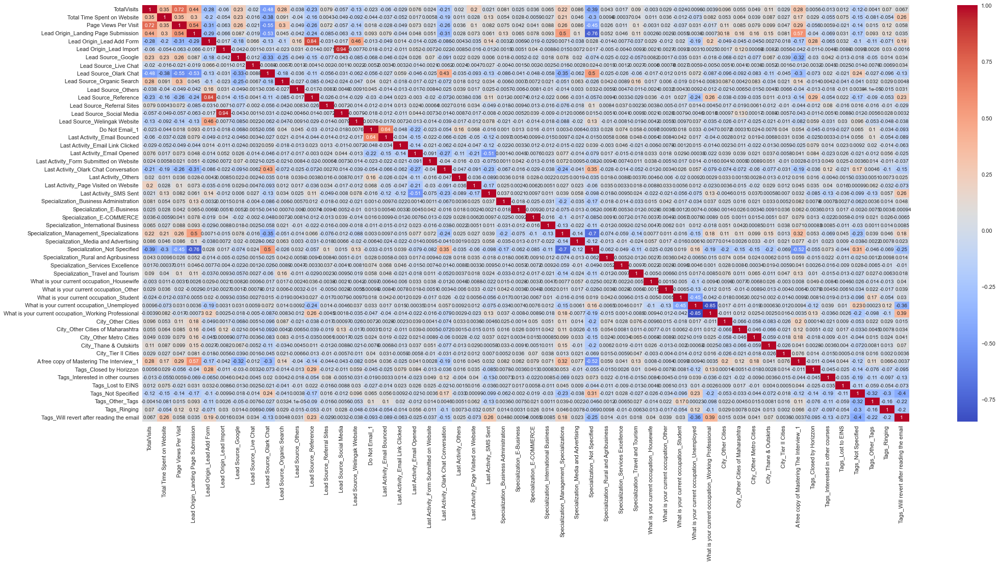

In [109]:
# Let's check the correlation coefficients to see which variables are highly correlated

plt.figure(figsize = (30, 15))

sns.heatmap(X_train.corr(), annot = True, cmap="coolwarm")
plt.show()

#### top 15 Correlation for X_train

In [110]:
#top 15 Correlation for X_train

correlation_0_target = X_train.corr()
correlation_0_target = correlation_0_target.where(np.triu(np.ones(correlation_0_target.shape), k=1).astype(np.bool))
correlation_0_target = correlation_0_target.unstack().reset_index().dropna(subset = [0])
correlation_0_target.columns = ['VAR1', 'VAR2', 'Correlation_Value']
correlation_0_target['Corr_abs'] = abs(correlation_0_target['Correlation_Value'])
correlation_0_target.sort_values(by = "Corr_abs", ascending =False, inplace = True)
correlation_0_target.head(15)

,VAR1,VAR2,Correlation_Value,Corr_abs
681,Lead Source_Social Media,Lead Origin_Lead Import,0.938732,0.938732
2013,What is your current occupation_Working Professional,What is your current occupation_Unemployed,-0.848957,0.848957
576,Lead Source_Reference,Lead Origin_Lead Add Form,0.840463,0.840463
1563,Specialization_Not Specified,Lead Origin_Landing Page Submission,-0.755735,0.755735
104,Page Views Per Visit,TotalVisits,0.722894,0.722894
1588,Specialization_Not Specified,Specialization_Management_Specializations,-0.696370,0.696370
847,Last Activity_Email Bounced,Do Not Email_1,0.635800,0.635800
2291,A free copy of Mastering The Interview_1,Lead Origin_Landing Page Submission,0.570558,0.570558
418,Lead Source_Olark Chat,Page Views Per Visit,-0.554489,0.554489
158,Lead Origin_Landing Page Submission,Page Views Per Visit,0.542453,0.542453


### Feature Selection 

In [111]:
import statsmodels.api as sm
from sklearn.linear_model import LogisticRegression
from sklearn.feature_selection import RFE

- Using RFE for features selection

In [112]:
# Using rfe for features selection

logreg=LogisticRegression()

In [113]:
## choosing top 15 variables

rfe=RFE(logreg,n_features_to_select=15)    # running RFE
rfe=rfe.fit(X_train,y_train)

In [114]:
rfe.support_

array([False,  True, False, False,  True, False, False, False,  True,
       False,  True, False, False, False,  True, False, False, False,
        True, False, False, False, False,  True, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False,  True, False, False, False, False, False, False,
        True,  True,  True,  True,  True,  True,  True])

In [115]:
# RFE Feature Ranking

rfe_ranking = pd.DataFrame({'rank' : rfe.ranking_, 'support': rfe.support_, 'features' : X_train.columns}).sort_values(by='rank',ascending=True)
rfe_ranking

,rank,support,features
51,1,True,Tags_Will revert after reading the email
18,1,True,Last Activity_Email Opened
14,1,True,Lead Source_Welingak Website
38,1,True,What is your current occupation_Working Professional
50,1,True,Tags_Ringing
10,1,True,Lead Source_Others
45,1,True,Tags_Closed by Horizzon
8,1,True,Lead Source_Olark Chat
23,1,True,Last Activity_SMS Sent
47,1,True,Tags_Lost to EINS


- top 15 variables are as

In [116]:
selected = rfe_ranking.loc[rfe_ranking['rank'] == 1,'features'].values
selected

array(['Tags_Will revert after reading the email',
       'Last Activity_Email Opened', 'Lead Source_Welingak Website',
       'What is your current occupation_Working Professional',
       'Tags_Ringing', 'Lead Source_Others', 'Tags_Closed by Horizzon',
       'Lead Source_Olark Chat', 'Last Activity_SMS Sent',
       'Tags_Lost to EINS', 'Tags_Not Specified',
       'Lead Origin_Lead Add Form', 'Tags_Other_Tags',
       'Total Time Spent on Website', 'Tags_Interested in other courses'],
      dtype=object)

### Building a Logistic Regression using statsmodel, for the detailed statistics

In [117]:
X_train_rfe = X_train[selected]


In [118]:
X_train_sm = sm.add_constant(X_train_rfe)
logm1 = sm.GLM(y_train,X_train_sm, family = sm.families.Binomial())
res = logm1.fit()
res.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:              Converted   No. Observations:                 6255
Model:                            GLM   Df Residuals:                     6239
Model Family:                Binomial   Df Model:                           15
Link Function:                  Logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -1264.1
Date:                Fri, 23 Dec 2022   Deviance:                       2528.1
Time:                        13:28:10   Pearson chi2:                 9.00e+03
No. Iterations:                     8   Pseudo R-squ. (CS):             0.6011
Covariance Type:            nonrobust                                         
========================================================================================================================
                                                           coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------------------------------------------------
const                                                   -2.1779      0.248     -8.778      0.000      -2.664      -1.692
Tags_Will revert after reading the email                 3.7222      0.293     12.719      0.000       3.149       4.296
Last Activity_Email Opened                               1.2576      0.145      8.692      0.000       0.974       1.541
Lead Source_Welingak Website                             3.6570      0.866      4.222      0.000       1.959       5.355
What is your current occupation_Working Professional     0.8360      0.395      2.116      0.034       0.062       1.610
Tags_Ringing                                            -4.1496      0.323    -12.854      0.000      -4.782      -3.517
Lead Source_Others                                       1.4217      0.704      2.020      0.043       0.042       2.801
Tags_Closed by Horizzon                                  5.6251      1.042      5.398      0.000       3.583       7.668
Lead Source_Olark Chat                                   1.3214      0.145      9.093      0.000       1.037       1.606
Last Activity_SMS Sent                                   2.8471      0.151     18.806      0.000       2.550       3.144
Tags_Lost to EINS                                        4.8642      0.764      6.366      0.000       3.366       6.362
Tags_Not Specified                                      -0.9479      0.227     -4.168      0.000      -1.394      -0.502
Lead Origin_Lead Add Form                                2.1219      0.465      4.558      0.000       1.210       3.034
Tags_Other_Tags                                         -3.3095      0.303    -10.930      0.000      -3.903      -2.716
Total Time Spent on Website                              1.1067      0.059     18.631      0.000       0.990       1.223
Tags_Interested in other courses                        -2.9466      0.404     -7.296      0.000      -3.738      -2.155
========================================================================================================================
"""

#### Model 1

In [119]:



X_train_rfe= X_train_rfe.drop(['Lead Source_Others'], axis = 1)

vif = pd.DataFrame()
vif['Features'] = X_train_rfe.columns
vif['VIF'] = [variance_inflation_factor(X_train_rfe.values, i) for i in range(X_train_rfe.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
0,Tags_Will revert after reading the email,2.38
1,Last Activity_Email Opened,2.25
7,Last Activity_SMS Sent,2.17
9,Tags_Not Specified,2.05
10,Lead Origin_Lead Add Form,1.86
6,Lead Source_Olark Chat,1.61
4,Tags_Ringing,1.45
12,Total Time Spent on Website,1.44
2,Lead Source_Welingak Website,1.36
3,What is your current occupation_Working Professional,1.34


In [120]:


X_train_sm1 = sm.add_constant(X_train_rfe)
logm2 = sm.GLM(y_train,X_train_sm1, family = sm.families.Binomial())
res = logm2.fit()
res.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:              Converted   No. Observations:                 6255
Model:                            GLM   Df Residuals:                     6240
Model Family:                Binomial   Df Model:                           14
Link Function:                  Logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -1266.0
Date:                Fri, 23 Dec 2022   Deviance:                       2532.0
Time:                        13:28:11   Pearson chi2:                 9.38e+03
No. Iterations:                     8   Pseudo R-squ. (CS):             0.6008
Covariance Type:            nonrobust                                         
========================================================================================================================
                                                           coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------------------------------------------------
const                                                   -2.1713      0.248     -8.759      0.000      -2.657      -1.685
Tags_Will revert after reading the email                 3.7115      0.292     12.699      0.000       3.139       4.284
Last Activity_Email Opened                               1.2545      0.145      8.678      0.000       0.971       1.538
Lead Source_Welingak Website                             3.3341      0.850      3.925      0.000       1.669       4.999
What is your current occupation_Working Professional     0.8195      0.394      2.078      0.038       0.046       1.593
Tags_Ringing                                            -4.1546      0.323    -12.873      0.000      -4.787      -3.522
Tags_Closed by Horizzon                                  5.5532      1.040      5.342      0.000       3.516       7.591
Lead Source_Olark Chat                                   1.3096      0.145      9.033      0.000       1.025       1.594
Last Activity_SMS Sent                                   2.8394      0.151     18.783      0.000       2.543       3.136
Tags_Lost to EINS                                        4.8590      0.764      6.359      0.000       3.361       6.357
Tags_Not Specified                                      -0.9389      0.227     -4.132      0.000      -1.384      -0.494
Lead Origin_Lead Add Form                                2.4312      0.437      5.558      0.000       1.574       3.288
Tags_Other_Tags                                         -3.3081      0.303    -10.924      0.000      -3.902      -2.715
Total Time Spent on Website                              1.1046      0.059     18.626      0.000       0.988       1.221
Tags_Interested in other courses                        -2.9461      0.403     -7.301      0.000      -3.737      -2.155
========================================================================================================================
"""

### Model 2

In [121]:
X_train_rfe= X_train_rfe.drop(['What is your current occupation_Working Professional'], axis = 1)

vif = pd.DataFrame()
vif['Features'] = X_train_rfe.columns
vif['VIF'] = [variance_inflation_factor(X_train_rfe.values, i) for i in range(X_train_rfe.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
1,Last Activity_Email Opened,2.25
6,Last Activity_SMS Sent,2.17
0,Tags_Will revert after reading the email,2.15
8,Tags_Not Specified,2.05
9,Lead Origin_Lead Add Form,1.84
5,Lead Source_Olark Chat,1.61
3,Tags_Ringing,1.45
11,Total Time Spent on Website,1.44
2,Lead Source_Welingak Website,1.35
10,Tags_Other_Tags,1.26


In [122]:
X_train_sm2 = sm.add_constant(X_train_rfe)
logm2 = sm.GLM(y_train,X_train_sm2, family = sm.families.Binomial())
res = logm2.fit()
res.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:              Converted   No. Observations:                 6255
Model:                            GLM   Df Residuals:                     6241
Model Family:                Binomial   Df Model:                           13
Link Function:                  Logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -1268.3
Date:                Fri, 23 Dec 2022   Deviance:                       2536.6
Time:                        13:28:11   Pearson chi2:                 9.55e+03
No. Iterations:                     8   Pseudo R-squ. (CS):             0.6005
Covariance Type:            nonrobust                                         
============================================================================================================
                                               coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------------------------------------
const                                       -2.1739      0.248     -8.767      0.000      -2.660      -1.688
Tags_Will revert after reading the email     3.8523      0.288     13.391      0.000       3.288       4.416
Last Activity_Email Opened                   1.2548      0.145      8.682      0.000       0.972       1.538
Lead Source_Welingak Website                 3.2969      0.850      3.881      0.000       1.632       4.962
Tags_Ringing                                -4.1468      0.322    -12.864      0.000      -4.779      -3.515
Tags_Closed by Horizzon                      5.7680      1.038      5.559      0.000       3.734       7.802
Lead Source_Olark Chat                       1.3106      0.145      9.038      0.000       1.026       1.595
Last Activity_SMS Sent                       2.8431      0.151     18.810      0.000       2.547       3.139
Tags_Lost to EINS                            4.8780      0.764      6.388      0.000       3.381       6.375
Tags_Not Specified                          -0.9354      0.227     -4.115      0.000      -1.381      -0.490
Lead Origin_Lead Add Form                    2.4669      0.437      5.640      0.000       1.610       3.324
Tags_Other_Tags                             -3.2840      0.302    -10.874      0.000      -3.876      -2.692
Total Time Spent on Website                  1.1056      0.059     18.650      0.000       0.989       1.222
Tags_Interested in other courses            -2.8928      0.402     -7.190      0.000      -3.681      -2.104
============================================================================================================
"""

### Final Model Summary

In [123]:
print(res.summary())

                 Generalized Linear Model Regression Results                  
Dep. Variable:              Converted   No. Observations:                 6255
Model:                            GLM   Df Residuals:                     6241
Model Family:                Binomial   Df Model:                           13
Link Function:                  Logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -1268.3
Date:                Fri, 23 Dec 2022   Deviance:                       2536.6
Time:                        13:28:11   Pearson chi2:                 9.55e+03
No. Iterations:                     8   Pseudo R-squ. (CS):             0.6005
Covariance Type:            nonrobust                                         
                                               coef    std err          z      P>|z|      [0.025      0.975]
-----------------------------------------------------------------------------------------------------

In [124]:
print(res.params)

const                                      -2.173904
Tags_Will revert after reading the email    3.852314
Last Activity_Email Opened                  1.254810
Lead Source_Welingak Website                3.296909
Tags_Ringing                               -4.146773
Tags_Closed by Horizzon                     5.767985
Lead Source_Olark Chat                      1.310647
Last Activity_SMS Sent                      2.843113
Tags_Lost to EINS                           4.877999
Tags_Not Specified                         -0.935425
Lead Origin_Lead Add Form                   2.466859
Tags_Other_Tags                            -3.283967
Total Time Spent on Website                 1.105552
Tags_Interested in other courses           -2.892754
dtype: float64


___All the VIF values are under 2.5 good and all the p-values are below 0.05. So we can fix model.___

In [125]:
# Predicting the 10 values of the train set

y_train_pred = res.predict(X_train_sm2)
y_train_pred[:10]

6133    0.058985
6681    0.002850
6869    0.180218
1012    0.024267
5615    0.016889
8257    0.978304
4689    0.094460
6282    0.073423
2949    0.002503
5140    0.001651
dtype: float64

In [126]:
# Reshaping to an array
y_train_pred = y_train_pred.values.reshape(-1)
y_train_pred[:10]

array([0.05898464, 0.00284994, 0.1802178 , 0.02426721, 0.01688889,
       0.97830438, 0.09446043, 0.07342293, 0.00250311, 0.0016514 ])

In [127]:
# Data frame with given convertion rate and probablity of predicted ones
y_train = y_train.values.reshape(-1)

In [128]:
y_train

array([0, 0, 0, ..., 1, 0, 0], dtype=int64)

In [129]:
y_train_pred_final = pd.DataFrame({'Converted':y_train, 'Conversion_Prob':y_train_pred})
y_train_pred_final.head()

,Converted,Conversion_Prob
0,0,0.058985
1,0,0.002850
2,0,0.180218
3,0,0.024267
4,0,0.016889


- Substituting 0 or 1 with the cut off as 0.5

In [130]:
# Substituting 0 or 1 with the cut off as 0.5

y_train_pred_final['Predicted'] = y_train_pred_final.Conversion_Prob.map(lambda x: 1 if x > 0.5 else 0)
y_train_pred_final.head()

,Converted,Conversion_Prob,Predicted
0,0,0.058985,0
1,0,0.002850,0
2,0,0.180218,0
3,0,0.024267,0
4,0,0.016889,0


### Model Evaluation

##### Now we can check how the model performs using the Confusion Matrix


In [131]:
# Now we can check how the model performs using the Confusion Matrix

# Importing metrics from SKlearn

from sklearn import metrics

confusion_matrix = metrics.confusion_matrix(y_train_pred_final.Converted, y_train_pred_final.Predicted )
print(confusion_matrix)

[[3736  173]
 [ 298 2048]]


- #Printing the overall accuracy of the model

In [132]:
# Printing the overall accuracy of the model
print(metrics.accuracy_score(y_train_pred_final.Converted, y_train_pred_final.Predicted))

0.9247002398081535


In [133]:
TP = confusion_matrix[1,1] # true positive 
TN = confusion_matrix[0,0] # true negatives
FP = confusion_matrix[0,1] # false positives
FN = confusion_matrix[1,0] # false negatives

In [134]:
print ("True positive is ",TP)
print ("True negatives is ",TN)
print ("False positives is ",FP)
print ("False negatives is ",FN)

True positive is  2048
True negatives is  3736
False positives is  173
False negatives is  298


#### Here we can see that we have got a very good predition with the model
- Now we need to Check on the sensitivity and Specificity

In [135]:
# Sensitivity
Sensitivity = round(TP / float(TP+FN)*100,2)
print('Sensitivity is ',Sensitivity,'%')

Sensitivity is  87.3 %


In [136]:
# Specificity
Specificity = round(TN / float(TN+FP)*100,2)
print('Specificity is ',Specificity,'%')

Specificity is  95.57 %


In [137]:
# Calculate False Postive Rate
#In technical terms, the false positive rate is defined as the probability of falsely rejecting the null hypothesis.

print(FP/ float(TN+FP))

0.04425684318239959


In [138]:
# positive predictive value 
print (TP / float(TP+FP))

0.9221071589374156


In [139]:
# Negative predictive value
print (TN / float(TN+ FN))

0.9261279127416956


### Optimise Cut off (ROC Curve)
The previous cut off was randomely selected. Now to find the optimum one

In [140]:
# ROC function
def draw_roc( actual, probs ):
    fpr, tpr, thresholds = metrics.roc_curve( actual, probs,
                                              drop_intermediate = False )
    auc_score = metrics.roc_auc_score( actual, probs )
    plt.figure(figsize=(5, 5))
    plt.plot( fpr, tpr, label='ROC curve (area = %0.2f)' % auc_score )
    plt.plot([0, 1], [0, 1], 'k--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate or [1 - True Negative Rate]')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver operating characteristic example')
    plt.legend(loc="lower right")
    plt.show()

    return None

In [141]:
fpr, tpr, thresholds = metrics.roc_curve( y_train_pred_final.Converted, y_train_pred_final.Conversion_Prob, drop_intermediate = False )

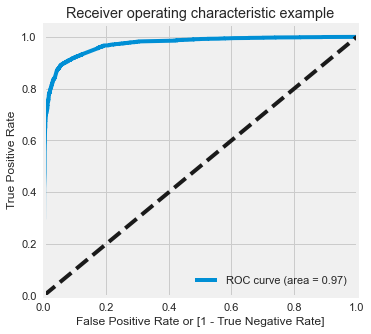

In [142]:
# Call the ROC function
draw_roc(y_train_pred_final.Converted, y_train_pred_final.Conversion_Prob)

Ovservation-
- Generally, the ROC Curve value should be close to 1 to be a good model.
- Here we are getting a good value of 0.97 indicating a good predictive model.

### Finding Optimal Cutoff Point

In [143]:
# Creating columns with different probability cutoffs 
numbers = [float(x)/10 for x in range(10)]
for i in numbers:
    y_train_pred_final[i]= y_train_pred_final.Conversion_Prob.map(lambda x: 1 if x > i else 0)
y_train_pred_final.head()

,Converted,Conversion_Prob,Predicted,0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9
0,0,0.058985,0,1,0,0,0,0,0,0,0,0,0
1,0,0.002850,0,1,0,0,0,0,0,0,0,0,0
2,0,0.180218,0,1,1,0,0,0,0,0,0,0,0
3,0,0.024267,0,1,0,0,0,0,0,0,0,0,0
4,0,0.016889,0,1,0,0,0,0,0,0,0,0,0


In [144]:
# Now let's calculate accuracy sensitivity and specificity for various probability cutoffs.
cutoff_df = pd.DataFrame( columns = ['prob','accuracy','sensi','speci'])
from sklearn.metrics import confusion_matrix

# TP = confusion[1,1] # true positive 
# TN = confusion[0,0] # true negatives
# FP = confusion[0,1] # false positives
# FN = confusion[1,0] # false negatives

num = [0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9]
for i in num:
    cm1 = metrics.confusion_matrix(y_train_pred_final.Converted, y_train_pred_final[i] )
    total1=sum(sum(cm1))
    accuracy = (cm1[0,0]+cm1[1,1])/total1
    
    speci = cm1[0,0]/(cm1[0,0]+cm1[0,1])
    sensi = cm1[1,1]/(cm1[1,0]+cm1[1,1])
    cutoff_df.loc[i] =[ i ,accuracy,sensi,speci]
cutoff_df

,prob,accuracy,sensi,speci
0.0,0.0,0.375060,1.000000,0.000000
0.1,0.1,0.845723,0.972293,0.769762
0.2,0.2,0.898321,0.930094,0.879253
0.3,0.3,0.914788,0.910060,0.917626
0.4,0.4,0.922942,0.894714,0.939882
0.5,0.5,0.924700,0.872975,0.955743
0.6,0.6,0.916387,0.824808,0.971348
0.7,0.7,0.910631,0.799233,0.977488
0.8,0.8,0.899281,0.757460,0.984395
0.9,0.9,0.884253,0.706309,0.991046


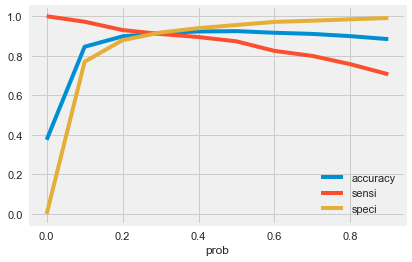

In [145]:
# Let's plot accuracy sensitivity and specificity for various probabilities.
cutoff_df.plot.line(x='prob', y=['accuracy','sensi','speci'])
plt.show()

#### From the graph we can see that the optimal cut off is bwetween 0.28-0.30, hence will consider it as 0.30

In [146]:
#### From the curve above, 0.3 is the optimum point to take it as a cutoff probability.

y_train_pred_final['final_Predicted'] = y_train_pred_final.Conversion_Prob.map( lambda x: 1 if x > 0.3 else 0)

y_train_pred_final.head()

,Converted,Conversion_Prob,Predicted,0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,final_Predicted
0,0,0.058985,0,1,0,0,0,0,0,0,0,0,0,0
1,0,0.002850,0,1,0,0,0,0,0,0,0,0,0,0
2,0,0.180218,0,1,1,0,0,0,0,0,0,0,0,0
3,0,0.024267,0,1,0,0,0,0,0,0,0,0,0,0
4,0,0.016889,0,1,0,0,0,0,0,0,0,0,0,0


In [147]:
# Let's check the overall accuracy.
round(metrics.accuracy_score(y_train_pred_final.Converted, y_train_pred_final.final_Predicted)*100,2)

91.48

In [148]:
confusion2 = metrics.confusion_matrix(y_train_pred_final.Converted, y_train_pred_final.final_Predicted )
confusion2

array([[3587,  322],
       [ 211, 2135]], dtype=int64)

In [149]:
TP = confusion2[1,1] # true positive 
TN = confusion2[0,0] # true negatives
FP = confusion2[0,1] # false positives
FN = confusion2[1,0] # false negatives

print("True positive is ",TP ) 
print('True negative is ',TN )
print('False positive is ',FP )
print('False negative is ',FN)

True positive is  2135
True negative is  3587
False positive is  322
False negative is  211


In [150]:
# Checking sensitivity of our logistic regression model
sensitivity = round(TP / float(TP+FN)*100,2)
sensitivity

91.01

In [151]:
# Checking specificity of our Logistic Regression Model
specificity = round(TN / float(TN+FP)*100,2)
specificity

91.76

#### Analysis: 
- Based on the scores that we have got, we can conlcude that our model performed very well.
- The ROC curve has a value of 0.97
#### Train
- Accuracy reached a total of 92.47%
- Sensitivity at 87.3%
- Specificity at 95.57%
#### Predict
- Accuracy reached a total of 91.48%
- Sensitivity at 91.01%
- Specificity at 91.01%

Further to the above, we can also calculate the below metrics
 - False Positive Rate
 - Positive Predictive Value
 - Negative Predictive Values
 - Precision & Recall. 

In [152]:
#### False Positive Rate

In [153]:
FPR = (FP/ float(TN+FP)*100)
print(round(FPR,2))

8.24


In [154]:
### Positive predictive

In [155]:
print ('Positive predictive value is ',round(TP / float(TP+FP)*100,2))

Positive predictive value is  86.89


In [156]:
### Negative predictive value

In [157]:
print ('Negative predictive value is ',round(TN / float(TN+ FN)*100,2))

Negative predictive value is  94.44


In [158]:
### Confusion matrix

In [159]:
confusion = metrics.confusion_matrix(y_train_pred_final.Converted, y_train_pred_final.final_Predicted )
confusion

array([[3587,  322],
       [ 211, 2135]], dtype=int64)

In [160]:
### Calculating Precision and Recall

In [161]:
# Importing Precision and Recall from SKlearn

from sklearn.metrics import precision_score, recall_score

In [162]:
precision  = precision_score(y_train_pred_final.Converted , y_train_pred_final.final_Predicted)
print('Precision is ',round(precision*100,2))

Precision is  86.89


In [163]:
Recall = recall_score(y_train_pred_final.Converted, y_train_pred_final.final_Predicted)
print('Recall is ',round(Recall*100,2))

Recall is  91.01


In [164]:
### Precision-Recall curves summarize the trade-off between the true positive rate and the positive predictive value for a predictive model using different probability thresholds.

In [165]:
#Importing Precision Recall curve
from sklearn.metrics import precision_recall_curve

In [166]:
y_train_pred_final.Converted, y_train_pred_final.final_Predicted
p, r, thresholds = precision_recall_curve(y_train_pred_final.Converted, y_train_pred_final.Conversion_Prob)

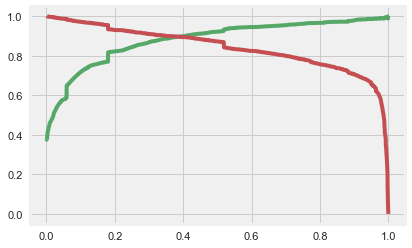

In [167]:
# Plotting the Precision Recall Curve

plt.plot(thresholds, p[:-1], "g-")
plt.plot(thresholds, r[:-1], "r-")
plt.show()

### Making Prediction on test set

In [168]:
X_test[['Total Time Spent on Website','Page Views Per Visit','TotalVisits']]=scaler.transform(X_test[['Total Time Spent on Website','Page Views Per Visit','TotalVisits']])

In [169]:
selected

array(['Tags_Will revert after reading the email',
       'Last Activity_Email Opened', 'Lead Source_Welingak Website',
       'What is your current occupation_Working Professional',
       'Tags_Ringing', 'Lead Source_Others', 'Tags_Closed by Horizzon',
       'Lead Source_Olark Chat', 'Last Activity_SMS Sent',
       'Tags_Lost to EINS', 'Tags_Not Specified',
       'Lead Origin_Lead Add Form', 'Tags_Other_Tags',
       'Total Time Spent on Website', 'Tags_Interested in other courses'],
      dtype=object)

In [170]:
X_test = X_test[selected]

In [171]:
X_test.head()

,Tags_Will revert after reading the email,Last Activity_Email Opened,Lead Source_Welingak Website,What is your current occupation_Working Professional,Tags_Ringing,Lead Source_Others,Tags_Closed by Horizzon,Lead Source_Olark Chat,Last Activity_SMS Sent,Tags_Lost to EINS,Tags_Not Specified,Lead Origin_Lead Add Form,Tags_Other_Tags,Total Time Spent on Website,Tags_Interested in other courses
2512,1,0,0,0,0,0,0,0,1,0,0,0,0,0.206648,0
4013,0,0,1,0,0,0,0,0,1,0,1,1,0,-0.878295,0
7788,0,0,0,0,0,0,0,0,0,0,0,0,1,-0.306401,0
4938,0,0,0,0,0,0,0,0,1,0,1,0,0,-0.821290,0
8949,1,1,0,0,0,0,0,0,0,0,0,0,0,-0.582234,0


In [172]:
# Add a constant to X_test
X_test_sm = sm.add_constant(X_test)
X_test_sm.head()

,const,Tags_Will revert after reading the email,Last Activity_Email Opened,Lead Source_Welingak Website,What is your current occupation_Working Professional,Tags_Ringing,Lead Source_Others,Tags_Closed by Horizzon,Lead Source_Olark Chat,Last Activity_SMS Sent,Tags_Lost to EINS,Tags_Not Specified,Lead Origin_Lead Add Form,Tags_Other_Tags,Total Time Spent on Website,Tags_Interested in other courses
2512,1.0,1,0,0,0,0,0,0,0,1,0,0,0,0,0.206648,0
4013,1.0,0,0,1,0,0,0,0,0,1,0,1,1,0,-0.878295,0
7788,1.0,0,0,0,0,0,0,0,0,0,0,0,0,1,-0.306401,0
4938,1.0,0,0,0,0,0,0,0,0,1,0,1,0,0,-0.821290,0
8949,1.0,1,1,0,0,0,0,0,0,0,0,0,0,0,-0.582234,0


### Predictions on the test set

In [173]:
logm3 = sm.GLM(y_test,X_test_sm, family = sm.families.Binomial())
res = logm3.fit()

In [174]:

# Storing prediction of test set in the variable 'y_test_pred'

In [175]:
y_test_pred = res.predict(X_test_sm)

In [176]:
y_test_pred[:10]

2512    0.986046
4013    1.000000
7788    0.002659
4938    0.242128
8949    0.871144
3755    0.077852
6236    0.228419
5845    0.073414
3342    0.125509
8152    0.000841
dtype: float64

In [177]:
# Coverting it to df

y_pred_df = pd.DataFrame(y_test_pred)

y_pred_df.head()

,0
2512,0.986046
4013,1.000000
7788,0.002659
4938,0.242128
8949,0.871144


In [178]:
# Converting y_test to dataframe
y_test_df = pd.DataFrame(y_test)


In [179]:
# Remove index for both dataframes to append them side by side 
y_pred_df.reset_index(drop=True, inplace=True)
y_test_df.reset_index(drop=True, inplace=True)


In [180]:
# Append y_test_df and y_pred_df
y_pred_final = pd.concat([y_test_df, y_pred_df],axis=1)


In [181]:
# Renaming column 
y_pred_final= y_pred_final.rename(columns = {0 : 'Conversion_Prob'})
y_pred_final.head()

,Converted,Conversion_Prob
0,1,0.986046
1,1,1.000000
2,0,0.002659
3,0,0.242128
4,1,0.871144


#### Final Prediction Figure

In [182]:
# Making prediction using cut off 0.35
y_pred_final['final_predicted'] = y_pred_final.Conversion_Prob.map(lambda x: 1 if x > 0.35 else 0)
y_pred_final

,Converted,Conversion_Prob,final_predicted
0,1,0.986046,1
1,1,1.000000,1
2,0,0.002659,0
3,0,0.242128,0
4,1,0.871144,1
...,...,...,...
2677,0,0.063349,0
2678,0,0.020760,0
2679,0,0.019958,0
2680,0,0.010170,0


#### Since we have got the model, we can evaluate the Accuracy, Precision, Recall

In [183]:
# Check the overall accuracy
round(metrics.accuracy_score(y_pred_final['Converted'], y_pred_final.final_predicted)*100,2)

91.91

In [184]:
# Creating confusion matrix 
confusion2 = metrics.confusion_matrix(y_pred_final['Converted'], y_pred_final.final_predicted )
confusion2

array([[1523,  112],
       [ 105,  942]], dtype=int64)

In [185]:
# Substituting the value of true positive
TP = confusion2[1,1]
# Substituting the value of true negatives
TN = confusion2[0,0]
# Substituting the value of false positives
FP = confusion2[0,1] 
# Substituting the value of false negatives
FN = confusion2[1,0]

print('True positive is ',TP)
print('True negatives is ',TN)
print('False positive is ',FP)
print('False Negatives is ',FN)

True positive is  942
True negatives is  1523
False positive is  112
False Negatives is  105


#### Optimise Cut off (ROC Curve)- Test Set

In [186]:
# ROC function
def draw_roc( actual, probs ):
    fpr, tpr, thresholds = metrics.roc_curve( actual, probs,
                                              drop_intermediate = False )
    auc_score = metrics.roc_auc_score( actual, probs )
    plt.figure(figsize=(5, 5))
    plt.plot( fpr, tpr, label='ROC curve (area = %0.2f)' % auc_score )
    plt.plot([0, 1], [0, 1], 'k--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate or [1 - True Negative Rate]')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver operating characteristic example')
    plt.legend(loc="lower right")
    plt.show()

    return None

In [187]:
fpr, tpr, thresholds = metrics.roc_curve( y_pred_final.Converted, y_pred_final.Conversion_Prob, drop_intermediate = False )

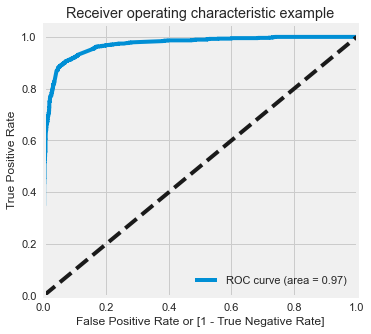

In [188]:
# Call the ROC function
draw_roc(y_pred_final.Converted, y_pred_final.Conversion_Prob)

In [189]:
# Calculating the sensitivity
round(TP/(TP+FN)*100,2)

89.97

In [190]:
# Calculating the specificity
round(TN/(TN+FP)*100,2)

93.15

In [191]:
Precision = precision_score(y_pred_final['Converted'] ,y_pred_final['final_predicted'])
Precision = round (Precision*100,2)
print('Precision is ',Precision)

Precision is  89.37


In [192]:
Recall = recall_score(y_pred_final['Converted'] , y_pred_final['final_predicted'])
Recall = round(Recall*100,2)
print('Recall is ',Recall)

Recall is  89.97


### Final Parameters for Model

In [195]:
res.params.sort_values(ascending= False)

Lead Source_Welingak Website                            24.207492
Tags_Closed by Horizzon                                  4.874759
Tags_Lost to EINS                                        3.898990
Tags_Will revert after reading the email                 3.373595
Last Activity_SMS Sent                                   2.823204
Lead Origin_Lead Add Form                                1.740332
Lead Source_Olark Chat                                   1.516198
Last Activity_Email Opened                               1.289553
Total Time Spent on Website                              1.030747
What is your current occupation_Working Professional     0.682807
Lead Source_Others                                       0.591780
Tags_Not Specified                                      -0.965812
const                                                   -2.151900
Tags_Other_Tags                                         -3.459246
Tags_Ringing                                            -3.642497
Tags_Inter

### The probability expression of the model can be written as 

####

const* -2.151900 +Tags_Will revert after reading the email* 3.373595+Last Activity_Email Opened * 1.289553 + Lead Source_Welingak Website *24.207492 + What is your current occupation_Working Professional* 0.682807 + Tags_Ringing * -3.642497 + Lead Source_Others * 0.591780 + Tags_Closed by Horizzon * 4.874759 + Lead Source_Olark Chat * 1.516198 + Last Activity_SMS Sent*2.823204 + Tags_Lost to EINS * 3.898990 + Tags_Not Specified* -0.965812 + Lead Origin_Lead Add Form * 1.740332 + Tags_Other_Tags* -3.459246 + Total Time Spent on Website* 1.030747 + Tags_Interested in other courses* -4.407353

### Reccomendations
- people whoo have opened the mail or reverted the mail are hot leads
- It’s good to collect data often and run the model and get updated with the potential leads. There is a belief that the best time to call your potential leads is within few hours after the lead shows interest in the courses
- Welingak Website has the most potentatial to convert prospects in to hot lead
- prospect interested in other courses are very kess chances to convert
- prospects who do not answer calls are less tend to convert in hot lead
- Lead Origin_Lead Add Form: Leads who have engaged through 'Lead Add Form' having higher conversion rate so company can focus on it to get more number of leads cause  have a higher chances of getting converted.
- Total Time Spent on website: Leads spending more time on website can be our potential lead.

### Detailed Analysis:

Our model ran vrey well with the Training Set. Initially we had to removed the variables, which did not add value to our analysis

#### Train Data metrics:
 - Accuracy : 92.47%
 - Sensitivity : 87.3%
 - Specificity : 95.57%
 
#### Train Pred Data metrics:
- Accuracy : 91.48%
- Sensitivity : 91.01%
- Specificity : 91.76%
- Percession : 86.89%
 
#### Test Data metrics:
- Accuracy : 91.91%
- Sensitivity : 89.97%
- Specificity : 93.15%
- Percession : 89.37%

#### Roc :  0.97